In [1]:
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
import os
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import math
import gc
import random
from sklearn.utils import shuffle

In [2]:
%matplotlib inline

##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"

# Read in the data, this could take a while

In [3]:
adata = sc.read('V6.5.flareAb.h5ad', cache=True)
print(adata)
figdir = "./figures."
sc.settings.figdir = "./figures."
MASTERCOLORS = sc.pl.palettes.default_64
MASTERCOLORS.remove("#FEFFE6")
MASTERCOLORS.remove("#FFFF00")

Only considering the two last: ['.flareAb', '.h5ad'].
Only considering the two last: ['.flareAb', '.h5ad'].
AnnData object with n_obs × n_vars = 145158 × 1161 
    obs: 'SOURCE', 'TR_UNT', 'batch_cov', 'ind_cov', 'well', 'Female', 'pop_cov', 'Broad', 'CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'disease_cov', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'SDPR', 'GNG11', 'PPBP', 'PC3', 'PC16', 'louvain', 'leiden'
    uns: 'barcodes', 'diffmap_evals', 'genes', 'leiden', 'louvain', 'neighbors', 'pca', 'raw_counts', 'total_pbmcs

In [4]:
## since we have replicates, let's sort adata in a consistent way
adata_obs_sorted = adata.obs.sort_values(by=['disease_cov','ind_cov','batch_cov'], ascending=False);
adata = adata[adata_obs_sorted.index]

In [5]:
adata.obs['site'] = pd.Categorical(adata.obs.disease_cov, categories=['Broad','UCSF'])
adata.obs.site[adata.obs.batch_cov.str.contains("IMMVAR")] = "Broad"
adata.obs.site[~adata.obs.batch_cov.str.contains("IMMVAR")] = "UCSF"

adata.obs['disease_pop_site_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             ordered=True)

# Sorting proportions by healthy versus treated versus untreated.
adata.obs['ind_cov_disease_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov']+ row['disease_cov'], axis=1),
                                             ordered=True)
adata.obs.to_csv('adata.obs.txt')

# Figure 6A: Projection and dropprint

In [125]:
sc.pl.umap(adata, size=3, color="disease_pop_site_cov", edgecolor="none", save='.disease_pop.png', palette=sc.pl.palettes.vega_20_scanpy)

saving figure to file ./figures./umap.disease_pop.png


saving figure to file ./figures./umap.disease.png


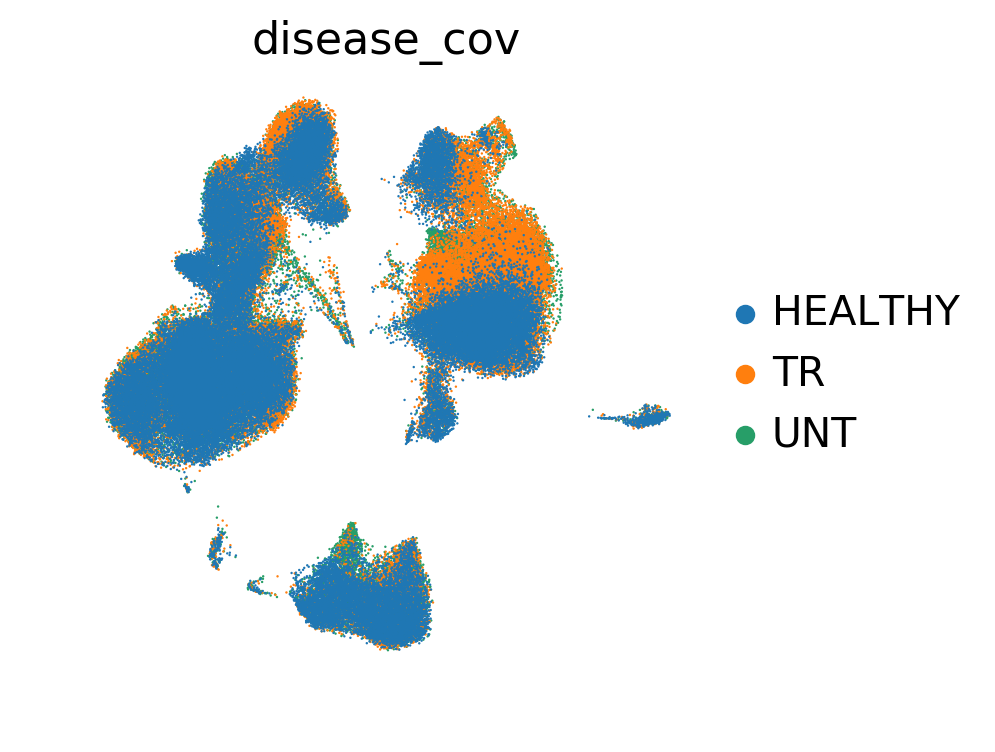

In [7]:
disease_umap = sc.pl.umap(adata, color='disease_cov', size=3, show=True, edgecolor="none", palette=sc.pl.palettes.vega_20_scanpy, save='.disease.png')

computing density on 'umap'
saving figure to file ./figures./umap_density_disease_cov_umap_density_disease_cov.png


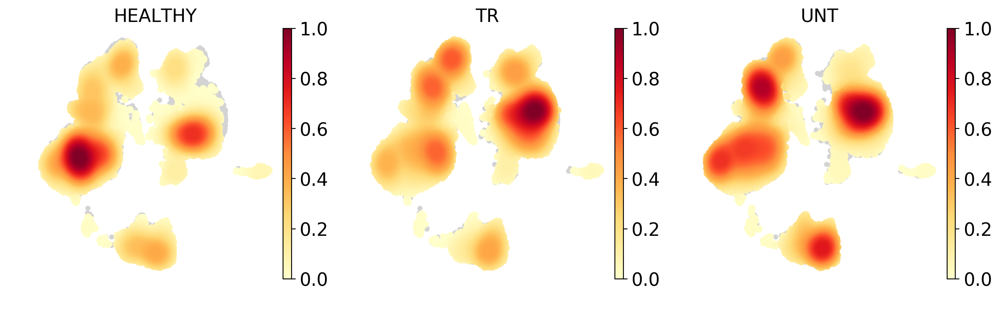

In [8]:
sc.tl.embedding_density(adata, basis='umap', groupby='disease_cov')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_disease_cov', show=True, save='umap_density_disease_cov.png')

saving figure to file ./figures./umap.batch.png


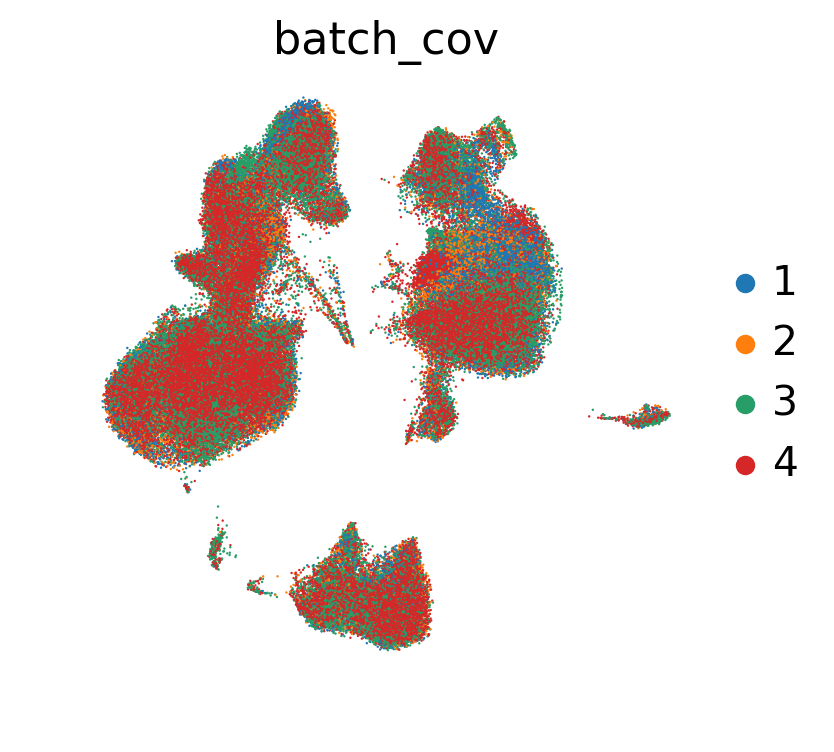

In [9]:
disease_umap = sc.pl.umap(adata, color='batch_cov', size=3,show=True, edgecolor="none", palette=sc.pl.palettes.vega_20_scanpy, save='.batch.png')

## Now, let's make a plot for each of the 16 people in batch 1 as a demo of variability

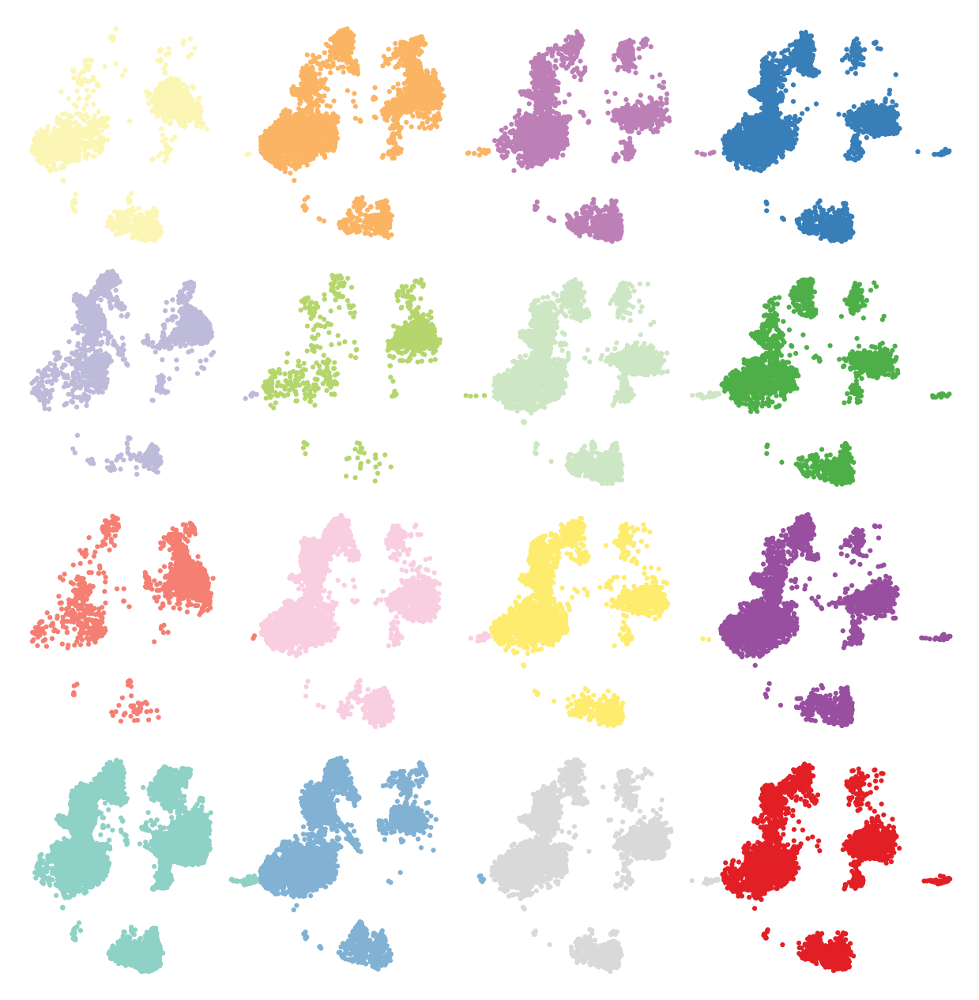

In [10]:
## let's plot 16 plots for the individuals.
colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F"];
fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7),sharex=True, sharey=True)
fig.tight_layout()
plt.subplots_adjust(wspace=-0.1, hspace=0)

batch_name = adata.obs.batch_cov.unique()[0]
batch = adata.obs.ind_cov_disease_cov[adata.obs.batch_cov==batch_name].unique();
batch = np.sort(batch.categories.values)
for ind_i in list(range(batch.shape[0])):
    ind = batch[ind_i]
    col = colors[ind_i]
    sc.pl.umap(adata[adata.obs.ind_cov_disease_cov==ind,], color = "ind_cov_disease_cov", title=None, palette=[col,col], ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=20, edgecolor="none")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")

fig.savefig(figdir+'/'+batch_name+'.ind.png')

ranking genes
    finished (0:03:05.76)


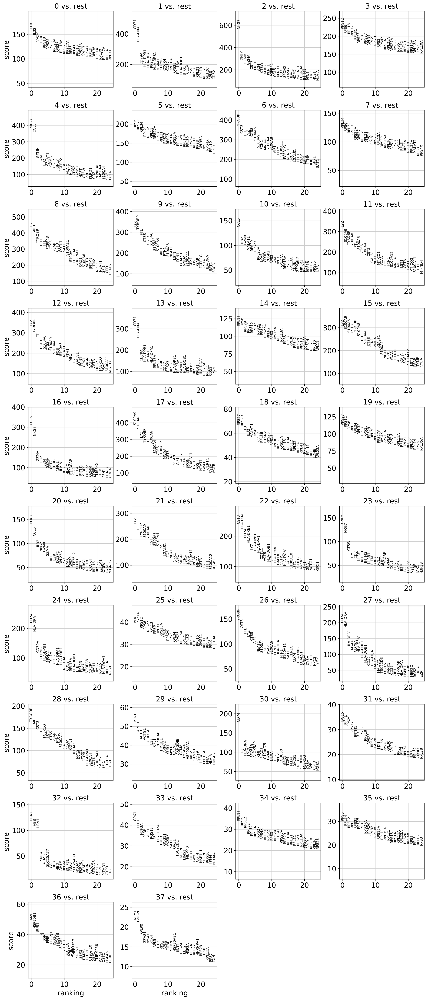

In [11]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

saving figure to file ./figures./umap.leiden.png


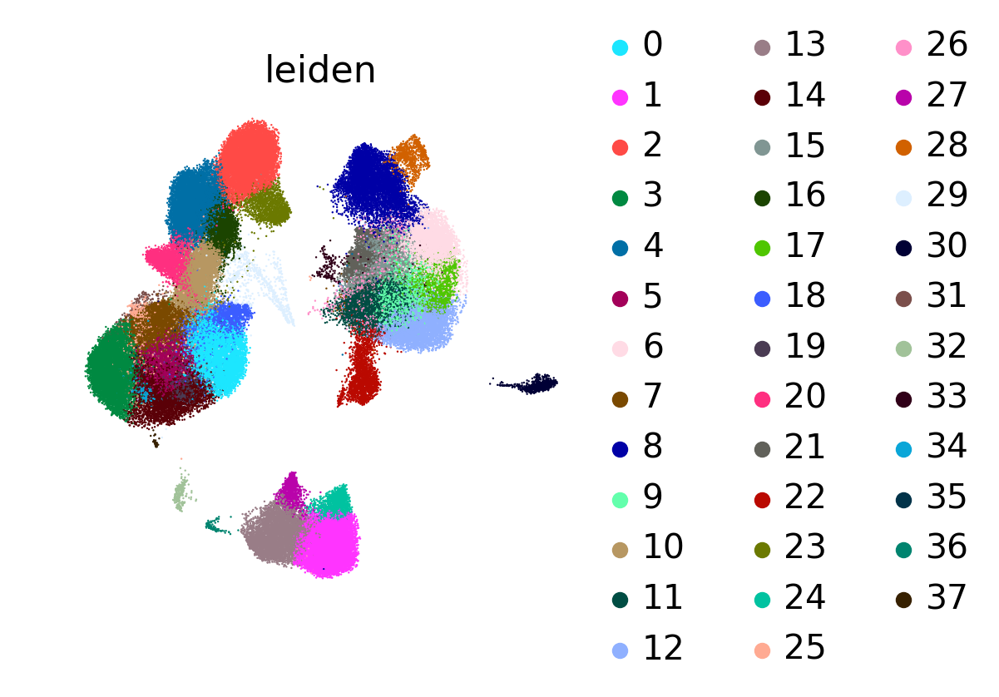

In [12]:
sc.pl.umap(adata, color='leiden', size=3, show=True, edgecolor="none", save='.leiden.png', palette=MASTERCOLORS)

# Most expressed genes per leiden group

In [13]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(adata.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = adata.var_names[np.flipud(np.argsort(np.mean(adata.X[adata.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.to_csv('FLARE_top_expression.csv')
GeneRanks.head(20)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12,leiden_13,leiden_14,leiden_15,leiden_16,leiden_17,leiden_18,leiden_19,leiden_20,leiden_21,leiden_22,leiden_23,leiden_24,leiden_25,leiden_26,leiden_27,leiden_28,leiden_29,leiden_30,leiden_31,leiden_32,leiden_33,leiden_34,leiden_35,leiden_36,leiden_37
0,IL7R,TCL1A,KLRF1,RP11-291B21.2,GZMH,TSHZ2,MNDA,CCR7,CDKN1C,LGALS2,GZMK,S100A12,IL1B,RP5-887A10.1,IL7R,RNASE2,CMC1,S100A12,RTKN2,FAM13A,KLRB1,IL1R2,FCER1A,XCL1,TCL1A,PF4,APOBEC3A,FCRL5,C1QB,KIAA0101,LILRA4,IFIT3,HBA1,TMEM40,C1QB,KIAA0101,MZB1,PRSS57
1,TNFRSF4,CD79A,GZMB,CD8B,CCL5,FHIT,IFITM3,IL7R,FCGR3A,CSTA,CCL5,VCAN,IL8,MS4A1,PRKCQ-AS1,RETN,CCL5,MNDA,RP11-1399P15.1,SOCS2,GZMK,CD163,CLEC10A,XCL2,RP11-164H13.1,ACRBP,MARCKS,PPP1R14A,C1QA,MKI67,SERPINF1,IFIT1,ALAS2,FCN1,C1QA,CENPF,TNFRSF17,SPINK2
2,IL32,MS4A1,PRF1,CCR7,NKG7,ADTRP,FCN1,LEF1,HES4,CST3,LYAR,CSTA,G0S2,BANK1,CD3E,S100A12,GZMH,RBP7,IL2RA,TRAT1,SLC4A10,RETN,CD1C,KLRC1,VPREB3,IL7R,CPVL,MS4A1,C1QC,TYMS,TPM2,MX1,SNCA,CST3,C1QC,MAL,IGJ,MYB
3,ITGB1,CD79B,SPON2,CD8A,FGFBP2,CCR7,CD14,RGS10,MS4A7,MS4A6A,DUSP2,MNDA,CCL3,CD79A,LEF1,VCAN,NKG7,VCAN,TIGIT,PRKCQ-AS1,DUSP2,PDK4,HLA-DQA1,SPTSSB,PPP1R14A,GNG11,LGALS2,CD79A,FCGR3A,STMN1,SCT,IFI44L,CA1,CSTA,IL7R,STMN1,DERL3,LAPTM4B
4,AQP3,LINC00926,GNLY,LEF1,CST7,PRKCQ-AS1,LGALS2,CD27,RP11-290F20.3,FCN1,IL32,CD14,CCL3L1,TNFRSF13B,MAL,MNDA,GZMA,CSTA,ICA1,ADTRP,KLRG1,SAP30,LMNA,KLRF1,CD79A,SDPR,FGL2,MPP6,MS4A7,TK1,PLD4,ISG15,HBA2,TYROBP,LEF1,MKI67,ITM2C,SOX4
5,CD40LG,FCER2,CLIC3,S100B,GZMA,MAL,TYMP,FHIT,LST1,AIF1,CD8B,CD36,NAMPT,RALGPS2,CCR7,CD163,CD8A,CYP1B1,IKZF2,PIM1,LYAR,CLEC4E,HLA-DQB1,CMC1,CD79B,RP11-367G6.3,CST3,CD19,HES4,CENPF,CLEC4C,HERC5,HBD,CD14,CCR7,IL7R,AL928768.3,PTPLA
6,RP11-403A21.2,VPREB3,FGFBP2,IL7R,GNLY,LEF1,IFI6,PRKCQ-AS1,RHOC,CTSS,FXYD2,FCN1,CSTA,AL928768.3,TRAT1,FCN1,CCL4,FCN1,ARID5B,MAL,NCR3,ARL4A,HLA-DPB1,GNLY,MS4A1,PPBP,AIF1,FCRLA,RP11-290F20.3,BIRC5,IL3RA,IFI6,AHSP,FCER1G,PRKCQ-AS1,CD3G,HRASLS2,EGFL7
7,GATA3,HLA-DRA,NKG7,NUCB2,IL32,IL7R,FGL2,MAL,LYPD2,MNDA,PIK3R1,GPX1,EREG,BLK,CD27,MGST1,CST7,PLBD1,IL32,IL7R,CCL5,THBS1,HLA-DPA1,CTSW,FCRLA,PRKCQ-AS1,FCN1,FCRL2,LYPD2,RRM2,ITM2C,ISG20,HBB,TYMP,CD3E,LEF1,TNFRSF13B,HEMGN
8,CRIP1,BANK1,CST7,CD27,ZNF683,TRAT1,TNFSF13B,CD3E,SERPINA1,TYROBP,CD8A,CTSS,S100A12,AC079767.4,CD3G,CSTA,IFNG,CD14,CD27,CLDN5,IL7R,VCAN,CPVL,IL2RB,FAM129C,CD3E,IFITM3,HLA-DQA1,CDKN1C,NUSAP1,PTCRA,CCR7,BPGM,CTSS,ADTRP,CCR7,IGLL5,WBP5
9,TRAT1,HLA-DQB1,GZMA,PRKCQ-AS1,GZMB,PASK,CST3,NUCB2,AIF1,FGL2,CD3E,CSF3R,LGALS2,CD79B,BCL11B,CD14,CD8B,QPCT,BIRC3,SLC40A1,GZMA,IRS2,HLA-DMA,KLRD1,NEIL1,MAL,IGSF6,FCRL3,IFITM3,PTTG1,LRRC26,XAF1,SLC25A37,MNDA,MAL,PCNA,CD38,ANKRD28


In [14]:
def marker_gene_expression(anndata, marker_dict, gene_symbol_key=None, partition_key='louvain_r1'):
   """A function go get mean z-score expressions of marker genes
   #
   # Inputs:
   #    anndata         - An AnnData object containing the data set and a partition
   #    marker_dict     - A dictionary with cell-type markers. The markers should be stores as anndata.var_names or
   #                      an anndata.var field with the key given by the gene_symbol_key input
   #    gene_symbol_key - The key for the anndata.var field with gene IDs or names that correspond to the marker
   #                      genes
   #    partition_key   - The key for the anndata.obs field where the cluster IDs are stored. The default is
   #                      'louvain_r1' """

   #Test inputs
   if partition_key not in anndata.obs.columns.values:
       print('KeyError: The partition key was not found in the passed AnnData object.')
       print('   Have you done the clustering? If so, please tell pass the cluster IDs with the AnnData object!')
       raise

   if (gene_symbol_key != None) and (gene_symbol_key not in anndata.var.columns.values):
       print('KeyError: The provided gene symbol key was not found in the passed AnnData object.')
       print('   Check that your cell type markers are given in a format that your anndata object knows!')
       raise


   if gene_symbol_key:
       gene_ids = anndata.var[gene_symbol_key]
   else:
       gene_ids = anndata.var_names

   clusters = anndata.obs[partition_key].cat.categories
   n_clust = len(clusters)
   marker_exp = pd.DataFrame(columns=clusters)
   marker_exp['cell_type'] = pd.Series({}, dtype='str')
   marker_names = []

   z_scores = sc.pp.scale(anndata, copy=True)

   i = 0
   for group in marker_dict:
       # Find the corresponding columns and get their mean expression in the cluster
       for gene in marker_dict[group]:
           ens_idx = np.in1d(gene_ids, gene) #Note there may be multiple mappings
           if np.sum(ens_idx) == 0:
               continue
           else:
               z_scores.obs[ens_idx[0]] = z_scores.X[:,ens_idx].mean(1) #works for both single and multiple mapping
               ens_idx = ens_idx[0]

           clust_marker_exp = z_scores.obs.groupby(partition_key)[ens_idx].apply(np.mean).tolist()
           clust_marker_exp.append(group)
           marker_exp.loc[i] = clust_marker_exp
           marker_names.append(gene)
           i+=1

   #Replace the rownames with informative gene symbols
   marker_exp.index = marker_names

   return(marker_exp)

marker_dictionary = pd.DataFrame({"all": adata.var_names})



In [15]:
# Load cross-sectional lymph data
lymph = pd.read_csv('/ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/lupus_paper/figure4.lymphoid.T/lymph_expr.ct_cov.csv')
lymph.rename(columns={'Unnamed: 0':'Gene'}, inplace=True)
lymph = lymph.set_index('Gene')
del lymph.index.name
# lymph data genes
lymphgenes = lymph.index.tolist()
# Intersection of genes for lymph
flaredata = adata[:, adata.var_names.isin(lymphgenes)]
marker_dictionary = pd.DataFrame({"all": flaredata.var_names})
flarelymph = marker_gene_expression(flaredata, marker_dictionary, partition_key="leiden")
lymphresult = pd.concat([lymph, flarelymph], axis=1, join='inner')

mono = pd.read_csv('/ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/lupus_paper/figure3.myeloid/myeloid_expr.ct_cov.csv')
mono.rename(columns={'Unnamed: 0':'Gene'}, inplace=True)
mono = mono.set_index('Gene')
del mono.index.name
# mono data genes
monogenes = mono.index.tolist()
# Intersection of genes for mono
flaredata = adata[:, adata.var_names.isin(monogenes)]
marker_dictionary = pd.DataFrame({"all": flaredata.var_names})
flaremono = marker_gene_expression(flaredata, marker_dictionary, partition_key="leiden")
monoresult = pd.concat([mono, flaremono], axis=1, join='inner')



Lymphocyte


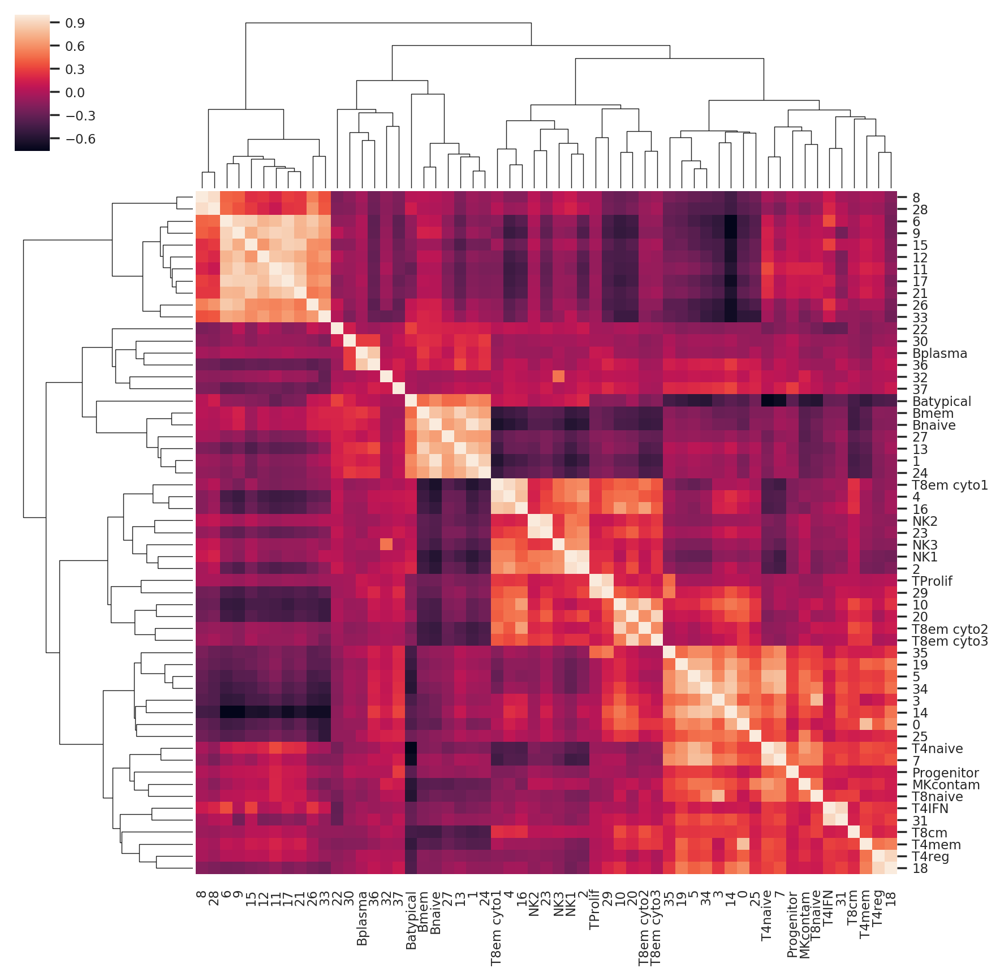

In [16]:
print('Lymphocyte')
lymphcorr = lymphresult.corr()
lymphcorr.to_csv('Lymphocyte_CrossX_Flare_Correlations.csv')
lymphcorr.style.background_gradient(cmap='coolwarm').set_precision(2)
import seaborn as sns; sns.set(color_codes=True); sns.set(font_scale=0.75)
g = sns.clustermap(lymphcorr, yticklabels=True, xticklabels=True)
g.savefig("Lymphocyte_CrossX_Flare_Correlations.png")

Myeloid


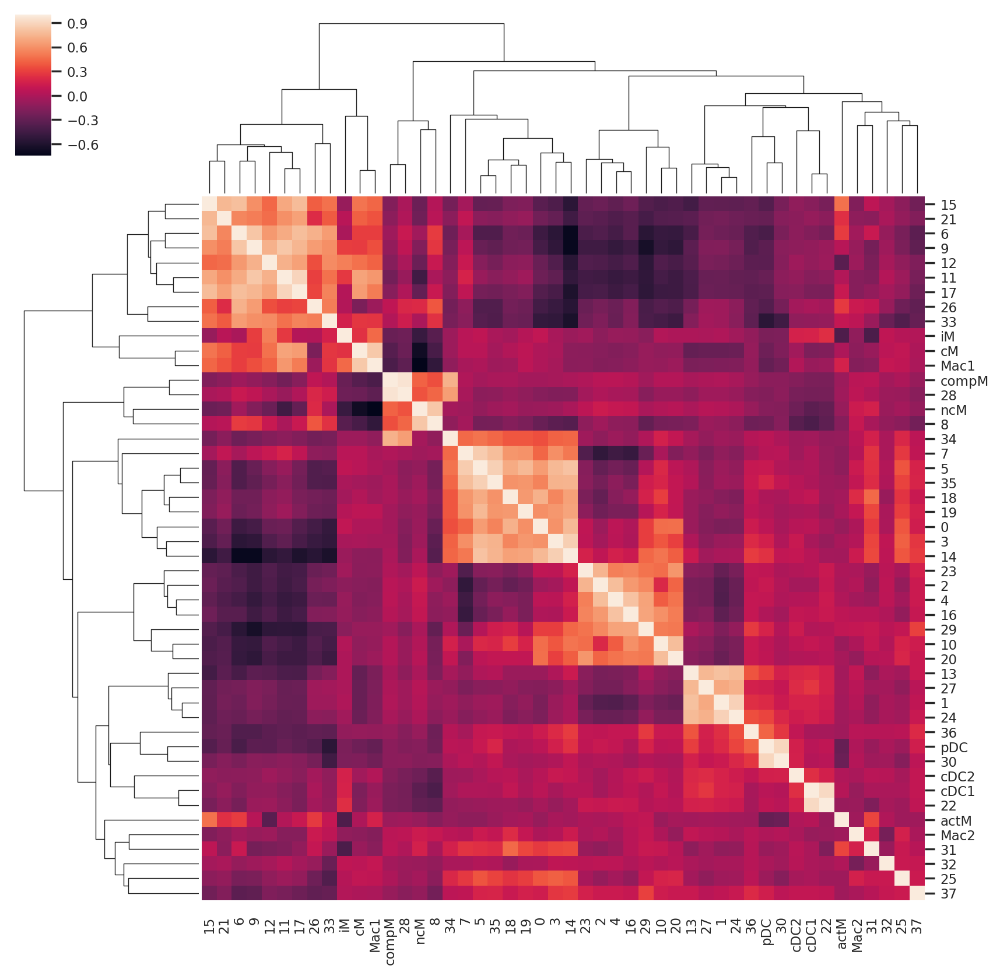

In [17]:
print('Myeloid')
monocorr = monoresult.corr()
monocorr.to_csv('Myeloid_CrossX_Flare_Correlations.csv')
monocorr.style.background_gradient(cmap='coolwarm').set_precision(2)
import seaborn as sns; sns.set(color_codes=True); sns.set(font_scale=0.75)
g = sns.clustermap(monocorr, yticklabels=True, xticklabels=True)
g.savefig("Myeloid_CrossX_Flare_Correlations.png")

# Cell type correlations with cross-sectional data

In [18]:
adata.obs['ct_cov'] = adata.obs['batch_cov'].astype("str")
# # ## do some manual cell type assignment
adata.obs['ct_cov'].loc[adata.obs.leiden == "0"] = "T4" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "1"] = "B" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "2"] = "NK" ## good                                                                                     
adata.obs['ct_cov'].loc[adata.obs.leiden == "3"] = "T8" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "4"] = "T8" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "5"] = "T4" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "6"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "7"] = "T4" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "8"] = "ncM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "9"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "10"] = "T8" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "11"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "12"] = "cM" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "13"] = "B" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "14"] = "T4" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "15"] = "cM" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "16"] = "T8" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "17"] = "cM" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "18"] = "T4" ## good                                                                              
adata.obs['ct_cov'].loc[adata.obs.leiden == "19"] = "DB" ## good                                                                               
adata.obs['ct_cov'].loc[adata.obs.leiden == "20"] = "T8" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "21"] = "cM" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "22"] = "cDC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "23"] = "NK" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "24"] = "B" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "25"] = "MK" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "26"] = "cM" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "27"] = "B" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "28"] = "ncM" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "29"] = "ProlifT" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "30"] = "pDC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "31"] = "T4" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "32"] = "RBC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "33"] = "cM" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "34"] = "T4" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "35"] = "T4" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "36"] = "B" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "37"] = "Progen" ##
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


# 11 populations figure6a and figure6b

saving figure to file ./figures./umap.figure6a.png


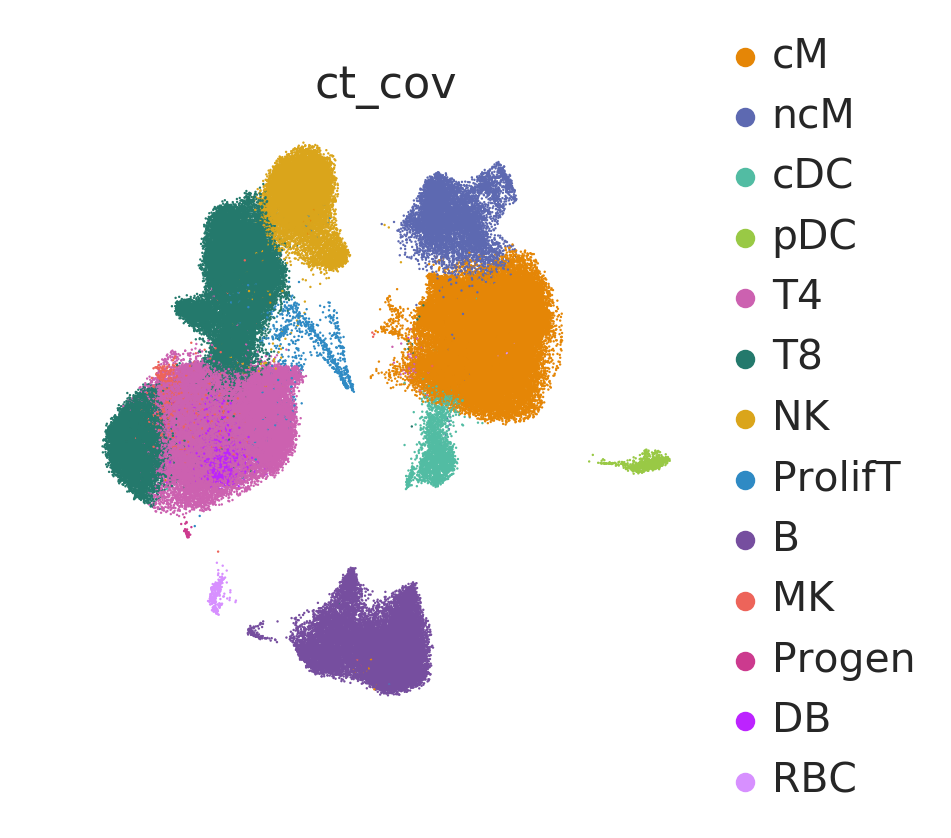

In [19]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
MasterORDER = ['cM', 'ncM', 'cDC', 'pDC', 'T4', 'T8', 'NK', 'ProlifT', 'B', 'MK', 'Progen', 'DB', 'RBC']
colorrs = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E",'#BC23FF', '#D790FF']
adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', show=True, size=3, edgecolor="none" ,save='.figure6a.png')


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY COUNTS


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Beta,Cell,Pval
0,-20.330976093864678,cM,6.63094e-05
1,-6.450437286197502,ncM,0.00017134
2,-0.012773965618698868,cDC,0.962243
3,0.24525306848826608,pDC,0.140422
4,15.551325067905076,T4,7.97089e-06
5,-6.369865500575588,T8,0.153297
6,-6.989019755751114,NK,0.00138295
7,-0.6417424954859051,ProlifT,0.00766568
8,1.484196129290919,B,0.432984
9,1.015881650042017,MK,0.000108491


as a proportion of total PBMC: Healthy vs. Untreated WEIGHTED BY COUNTS


,Beta,Cell,Pval
0,-16.58501223311218,cM,0.00139213
1,-0.7276573548197844,ncM,0.361997
2,0.8751151208333419,cDC,0.00552702
3,0.6101370228949559,pDC,0.0063171
4,14.641396055247753,T4,2.67855e-06
5,-6.187141439755944,T8,0.0110418
6,-1.9232324923646498,NK,0.165455
7,-1.9442115038058996,ProlifT,0.00243025
8,-9.189436353304087,B,0.0111327
9,0.8752879648689021,MK,5.70361e-05


as a proportion of total PBMC: Treated vs. Untreated WEIGHTED BY COUNTS


,Beta,Cell,Pval
0,3.7459638607524663,cM,0.568593
1,5.722779931377719,ncM,0.00469945
2,0.8878890864520397,cDC,0.00930797
3,0.3648839544066902,pDC,0.00465592
4,-0.9099290126573214,T4,0.643232
5,0.18272406081963233,T8,0.968434
6,5.065787263386463,NK,0.0581515
7,-1.302469008319994,ProlifT,0.0564971
8,-10.673632482595007,B,0.0253796
9,-0.14059368517311488,MK,0.172987


as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY COUNTS


,Beta,Cell,Pval
0,-18.725324051740532,cM,0.000173731
1,-4.77612730424958,ncM,0.00140087
2,0.2592759958125672,cDC,0.258162
3,0.35635555460568735,pDC,0.00722403
4,15.083019253632827,T4,6.29622e-10
5,-6.266080556595099,T8,0.0496245
6,-5.133412215809746,NK,0.00449089
7,-1.5067103577138217,ProlifT,0.00644402
8,-5.211672120915708,B,0.083643
9,0.933216320675196,MK,1.92805e-08


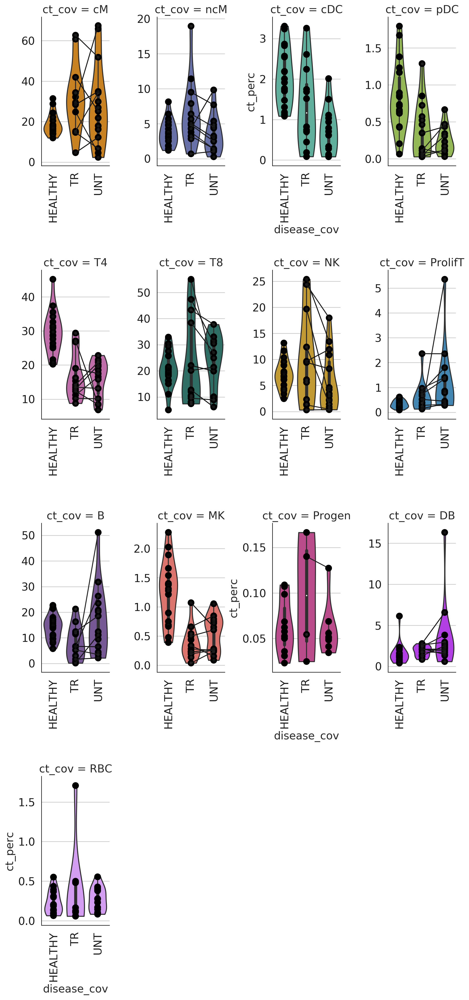

In [20]:
## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov','disease_cov','pop_cov', 'ind_cov'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {    'ct_cov':['pDC', 'iM',   'compM', 'NKCD16-', 'NKCD16+', 'Batypical', 'DB',      'Progen',  'Th',    'Bplasma', 'Bmem',  'Bnaive', 'cM',   'ncM',  'iM',  'T4naive', 'Macro', 'T4mem', 'T8mem', 'T8em cyto1','T4IFN', 'T8em cyto2', 'T8em cyto3', 'T8naive', 'Treg',  'NK',    'ProlifT', 'Tc1q+', 'cDC', 'RBC'], 
                          'ct_group':['mono', 'mono', 'mono',  'lymph',   'lymph',   'lymph',     'Doublet', 'Progen',  'lymph', 'lymph',   'lymph', 'lymph',  'mono', 'mono', 'mono','lymph',   'mono',  'lymph', 'lymph', 'lymph',     'lymph', 'lymph',      'lymph',      'lymph',   'lymph', 'lymph', 'lymph',   'lymph', 'mono','RBC']})

# Add cell type macrogroup as observation
adata.obs['ct_group'] = adata.obs['ct_cov'].tolist()
celltypes = np.unique(cg_cov['ct_cov'].tolist())
for ii in range(len(celltypes)):
    adata.obs['ct_group'][adata.obs['ct_cov']==cg_cov['ct_cov'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=4, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0", scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.ct_cov_figure6b.png")

def highlight(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    # bonferroni correction
    #sig = data < (0.05/len(data))
    sig = data < (0.05/3)
    return [attr if v else '' for v in sig]

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'TR'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="TR"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Untreated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="UNT"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)


# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Untreated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['TR', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="UNT"] = 0
    disease.values[disease=="TR"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'TR', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="HEALTHY"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

In [21]:
print('Healthy')
display(ind_perc[ind_perc.disease_cov=='HEALTHY'][ind_perc.ct_cov=='pDC'].ct_perc.mean())
print('Flare')
display(ind_perc[ind_perc.disease_cov=='UNT'][ind_perc.ct_cov=='pDC'].ct_perc.mean())

Healthy


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


0.8321687671644376

Flare


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


0.2489137624864502

# Cell type correlation plot

# Feature plots for Untreated Treated pairs

In [124]:
pairs = ['FLARE004', 'FLARE009', 'FLARE011', 'FLARE013', 'FLARE016', '904194200_904194200', '1586_1586', '1763_1763']
colors = ["#000000", "#FF0000"]
for pair in pairs:
    bdata = adata[adata.obs['ind_cov']==pair]
    print(pair)
    sc.pl.umap(bdata, size=10, show=False, color='disease_cov', save=str('TREATED_UNTREATED_PAIR'+ pair + '.disease.png'), palette=colors)
    plt.show()
    

FLARE004
saving figure to file ./figures./umapTREATED_UNTREATED_PAIRFLARE004.disease.png
FLARE009
saving figure to file ./figures./umapTREATED_UNTREATED_PAIRFLARE009.disease.png
FLARE011
saving figure to file ./figures./umapTREATED_UNTREATED_PAIRFLARE011.disease.png
FLARE013
saving figure to file ./figures./umapTREATED_UNTREATED_PAIRFLARE013.disease.png
FLARE016
saving figure to file ./figures./umapTREATED_UNTREATED_PAIRFLARE016.disease.png
904194200_904194200
saving figure to file ./figures./umapTREATED_UNTREATED_PAIR904194200_904194200.disease.png
1586_1586
saving figure to file ./figures./umapTREATED_UNTREATED_PAIR1586_1586.disease.png
1763_1763
saving figure to file ./figures./umapTREATED_UNTREATED_PAIR1763_1763.disease.png


# Higher resolution subpopulation labeling

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


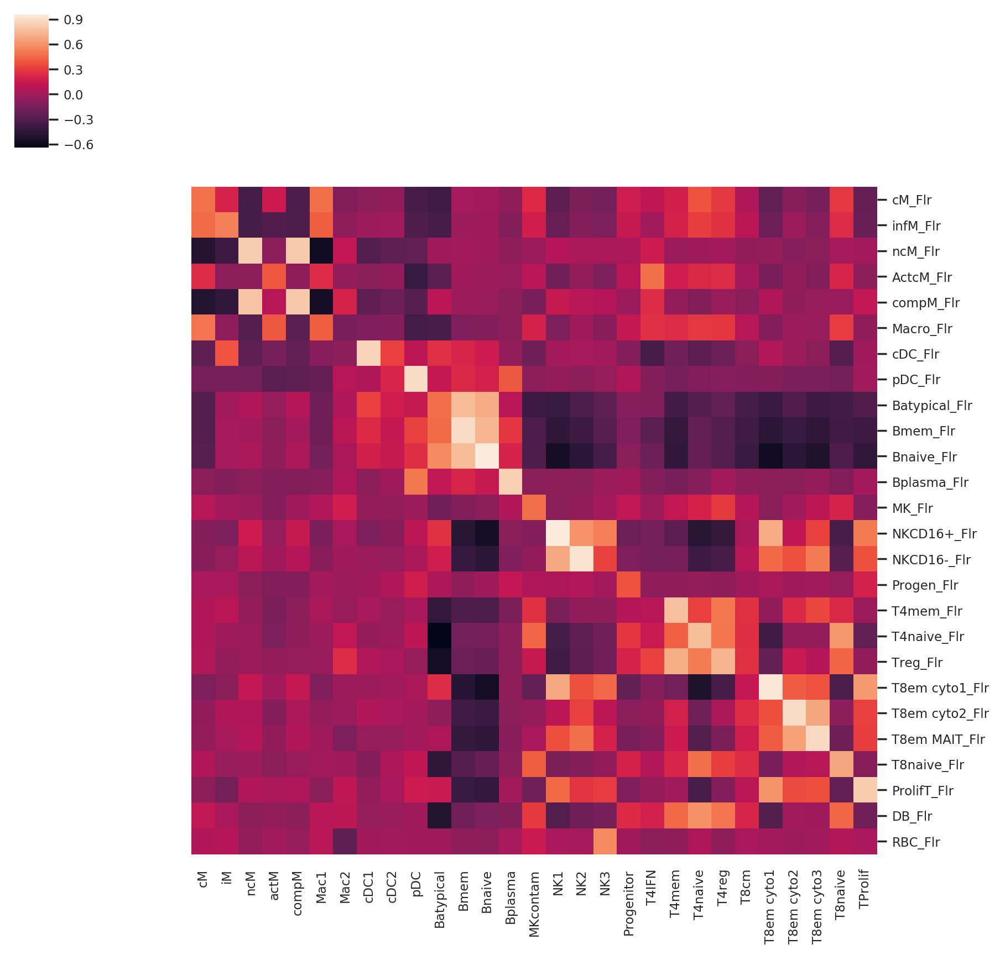

In [23]:
adata.obs['ct_cov'] = adata.obs['batch_cov'].astype("str")
# # ## do some manual cell type assignment
adata.obs['ct_cov'].loc[adata.obs.leiden == "0"] = "T4mem_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "1"] = "Bnaive_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "2"] = "NKCD16+_Flr" ## good                                                                                     
adata.obs['ct_cov'].loc[adata.obs.leiden == "3"] = "T8naive_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "4"] = "T8em cyto1_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "5"] = "T4naive_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "6"] = "ActcM_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "7"] = "T4naive_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "8"] = "ncM_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "9"] = "cM_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "10"] = "T8em cyto2_Flr" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "11"] = "cM_Flr" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "12"] = "infM_Flr" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "13"] = "Bmem_Flr" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "14"] = "T4naive_Flr" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "15"] = "Macro_Flr" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "16"] = "T8em cyto1_Flr" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "17"] = "cM_Flr" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "18"] = "Treg_Flr" ## good                                                                              
adata.obs['ct_cov'].loc[adata.obs.leiden == "19"] = "DB_Flr" ## good                                                                               
adata.obs['ct_cov'].loc[adata.obs.leiden == "20"] = "T8em MAIT_Flr" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "21"] = "Macro_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "22"] = "cDC_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "23"] = "NKCD16-_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "24"] = "Bnaive_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "25"] = "MK_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "26"] = "cM_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "27"] = "Batypical_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "28"] = "compM_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "29"] = "ProlifT_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "30"] = "pDC_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "31"] = "T4naive_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "32"] = "RBC_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "33"] = "cM_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "34"] = "T4naive_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "35"] = "T4naive_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "36"] = "Bplasma_Flr" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "37"] = "Progen_Flr" ##
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')

catORDER = ['cM_Flr', 'infM_Flr', 'ncM_Flr', 'ActcM_Flr', 'compM_Flr', 'Macro_Flr', 'cDC_Flr', 'pDC_Flr', 'Batypical_Flr', 'Bmem_Flr', 'Bnaive_Flr',
                                                                 'Bplasma_Flr', 'MK_Flr', 'NKCD16+_Flr', 'NKCD16-_Flr', 'Progen_Flr', 'T4mem_Flr', 'T4naive_Flr', 'Treg_Flr', 'T8em cyto1_Flr', 'T8em cyto2_Flr', 'T8em MAIT_Flr', 
                                                                 'T8naive_Flr', 'ProlifT_Flr', 'DB_Flr', 'RBC_Flr']
adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(catORDER)


# Load cross-sectional lymph data
lymph = pd.read_csv('/ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/lupus_paper/figure4.lymphoid.T/lymph_expr.ct_cov.csv')
lymph.rename(columns={'Unnamed: 0':'Gene'}, inplace=True)
lymph = lymph.set_index('Gene')
del lymph.index.name
mono = pd.read_csv('/ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/lupus_paper/figure3.myeloid/myeloid_expr.ct_cov.csv')
mono.rename(columns={'Unnamed: 0':'Gene'}, inplace=True)
mono = mono.set_index('Gene')
del mono.index.name

marker_dictionary = pd.DataFrame({"all": adata.var_names})
flare = marker_gene_expression(adata, marker_dictionary, partition_key="ct_cov")
corrresult = pd.concat([mono, lymph, flare], axis=1, join='inner')

crossX_Flarecorr = corrresult.corr()
# Remove duplicate labels from column (the diagnal of correlation plot)
crossX_Flarecorr = crossX_Flarecorr.drop(columns=catORDER)
# Remove columns headers from row
crossX_Flarecorr = crossX_Flarecorr.drop(labels=list(crossX_Flarecorr.columns.values))
crossX_Flarecorr.to_csv('CrossX_Flare_Correlations.csv')
crossX_Flarecorr.style.background_gradient(cmap='coolwarm').set_precision(2)
import seaborn as sns; sns.set(color_codes=True); sns.set(font_scale=0.75)
g = sns.clustermap(crossX_Flarecorr, yticklabels=True, xticklabels=True, col_cluster=False, row_cluster=False)
g.savefig("figures./CrossX_Flare_pop_Correlations.png")


In [24]:
adata.obs['ct_cov'] = adata.obs['batch_cov'].astype("str")
# # ## do some manual cell type assignment
adata.obs['ct_cov'].loc[adata.obs.leiden == "0"] = "T4mem" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "1"] = "Bnaive" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "2"] = "NKCD16+" ## good                                                                                     
adata.obs['ct_cov'].loc[adata.obs.leiden == "3"] = "T8naive" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "4"] = "T8em cyto1" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "5"] = "T4naive" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "6"] = "ActcM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "7"] = "T4naive" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "8"] = "ncM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "9"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "10"] = "T8em cyto2" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "11"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "12"] = "infM" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "13"] = "Bmem" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "14"] = "T4naive" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "15"] = "Macro" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "16"] = "T8em cyto1" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "17"] = "cM" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "18"] = "Treg" ## good                                                                              
adata.obs['ct_cov'].loc[adata.obs.leiden == "19"] = "DB" ## good                                                                               
adata.obs['ct_cov'].loc[adata.obs.leiden == "20"] = "T8em MAIT" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "21"] = "Macro" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "22"] = "cDC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "23"] = "NKCD16-" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "24"] = "Bnaive" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "25"] = "MK" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "26"] = "cM" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "27"] = "Batypical" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "28"] = "compM" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "29"] = "ProlifT" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "30"] = "pDC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "31"] = "T4naive" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "32"] = "RBC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "33"] = "cM" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "34"] = "T4naive" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "35"] = "T4naive" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "36"] = "Bplasma" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "37"] = "Progen" ##
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


... storing 'ct_group' as categorical


saving figure to file ./figures./umap.figure6c.png


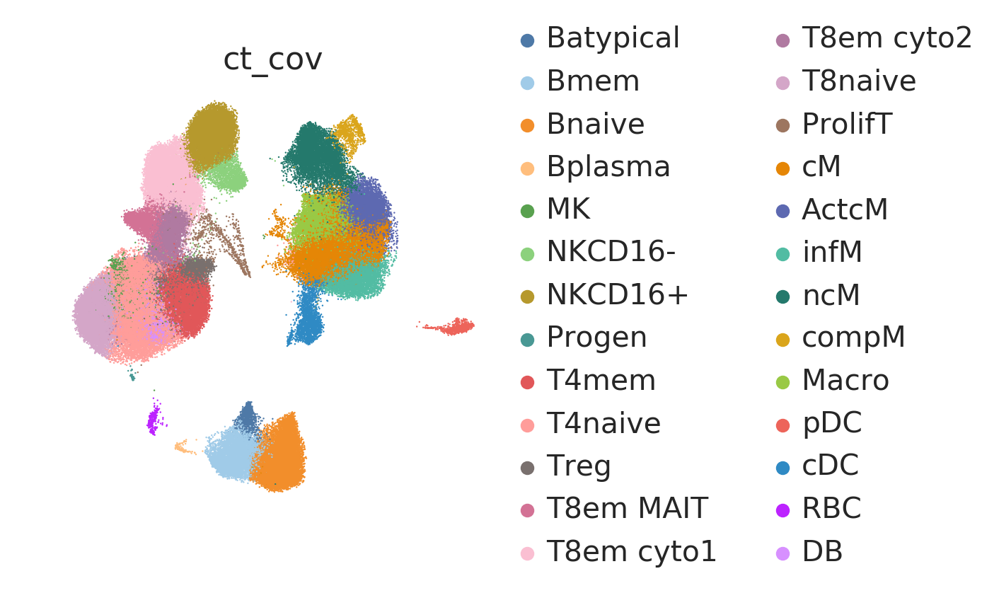

In [25]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
MasterORDER = ['Batypical', 'Bmem', 'Bnaive', 'Bplasma', 'MK', 'NKCD16-', 'NKCD16+', 'Progen', 'T4mem', 'T4naive', 'Treg', 'T8em MAIT', 'T8em cyto1', 'T8em cyto2', 'T8naive', 'ProlifT', 'cM', 'ActcM', 'infM', 'ncM', 'compM', 'Macro', 'pDC', 'cDC', 'RBC', 'DB']
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#59A14F","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E","#D37295","#FABFD2","#B07AA1","#D4A6C8","#9D7660",
                 "#E58606", "#5D69B1", "#52BCA3", "#24796C", '#DAA51B', '#99C945', '#ED645A', '#2F8AC4', '#BC23FF', '#D790FF']

adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', size=3, show=True, edgecolor="none", save='.figure6c.png', palette=colorrs)


# Statistics

In [26]:
## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov','disease_cov','pop_cov', 'ind_cov'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {    'ct_cov':['ActcM','pDC', 'infM',   'compM', 'NKCD16-', 'NKCD16+', 'Batypical', 'DB',      'Progen',  'Th',    'Bplasma', 'Bmem',  'Bnaive', 'cM',   'ncM',  'iM',  'T4naive', 'Macro', 'T4mem', 'T8mem', 'T8em cyto1','T4IFN', 'T8em cyto2', 'T8em MAIT', 'T8naive', 'Treg',  'NK',    'ProlifT', 'Tc1q+', 'cDC', 'RBC'], 
                          'ct_group':['mono','mono', 'mono', 'mono',  'lymph',   'lymph',   'lymph',     'Doublet', 'Progrenitor',  'lymph', 'lymph',   'lymph', 'lymph',  'mono', 'mono', 'mono','lymph',   'mono',  'lymph', 'lymph', 'lymph',     'lymph', 'lymph',      'lymph',      'lymph',   'lymph', 'lymph', 'lymph',   'lymph', 'mono','RBC']})

# Add cell type macrogroup as observation
adata.obs['ct_group'] = adata.obs['ct_cov'].tolist()
celltypes = np.unique(cg_cov['ct_cov'].tolist())
for ii in range(len(celltypes)):
    adata.obs['ct_group'][adata.obs['ct_cov']==cg_cov['ct_cov'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

def highlight(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    # bonferroni correction
    #sig = data < (0.05/len(data))
    sig = data < (0.05/3)
    return [attr if v else '' for v in sig]

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'TR'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="TR"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Untreated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="UNT"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)


# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Untreated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['TR', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="UNT"] = 0
    disease.values[disease=="TR"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'TR', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="HEALTHY"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY COUNTS


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Beta,Cell,Pval
0,-0.09097273418172172,Batypical,0.316606
1,4.2717031135630155,Bmem,0.00129129
2,-2.175631165377779,Bnaive,0.216418
3,-0.2226047457443855,Bplasma,0.0015374
4,1.015881650042017,MK,0.000108491
5,-0.0532444673115032,NKCD16-,0.863642
6,-7.299163225737432,NKCD16+,0.00113993
7,-0.03162907912513521,Progen,0.230993
8,-1.5836266534510166,T4mem,0.406787
9,15.38045523869707,T4naive,5.18323e-05


as a proportion of total PBMC: Healthy vs. Untreated WEIGHTED BY COUNTS


,Beta,Cell,Pval
0,-5.27823671553437,Batypical,0.00512714
1,2.242417470188729,Bmem,0.029099
2,-10.270924622102447,Bnaive,0.00296252
3,-0.24302632102952082,Bplasma,0.0185184
4,0.8752879648689021,MK,5.70361e-05
5,0.5501993702533535,NKCD16-,0.0157868
6,-2.2741271133775327,NKCD16+,0.0816021
7,0.010703160924348025,Progen,0.46413
8,3.0967521505055555,T4mem,0.0076753
9,13.334251009767586,T4naive,3.32978e-05


as a proportion of total PBMC: Treated vs. Untreated WEIGHTED BY COUNTS


,Beta,Cell,Pval
0,-5.1872639813526495,Batypical,0.0423635
1,-2.029285643374287,Bmem,0.00246856
2,-8.095293456724654,Bnaive,0.0632694
3,-0.02042157528513536,Bplasma,0.889747
4,-0.14059368517311488,MK,0.172987
5,0.6034438375648562,NKCD16-,0.121575
6,5.0250361123598974,NKCD16+,0.0575717
7,0.042332240049483195,Progen,0.195736
8,4.680378803956577,T4mem,0.0346142
9,-2.0462042289294855,T4naive,0.0952394


as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY COUNTS


,Beta,Cell,Pval
0,-4.791367210911469,Batypical,0.00618411
1,2.967090049069521,Bmem,0.000269052
2,-6.943740037172597,Bnaive,0.0169169
3,-0.23697548390799933,Bplasma,0.0117606
4,0.933216320675196,MK,1.92805e-08
5,0.17376535729622794,NKCD16-,0.467017
6,-5.465120942361799,NKCD16+,0.00291181
7,-0.008699115764998445,Progen,0.634708
8,0.384444799704002,T4mem,0.789626
9,14.208221882940935,T4naive,4.25858e-09


In [27]:
print('Healthy')
display(ind_perc[ind_perc.disease_cov=='HEALTHY'][ind_perc.ct_cov=='Batypical'].ct_perc.mean())
print('Flare')
display(ind_perc[ind_perc.disease_cov=='UNT'][ind_perc.ct_cov=='Batypical'].ct_perc.mean())

Healthy


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


0.21313838619471748

Flare


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


1.6469590065984205

# Lymphocytes

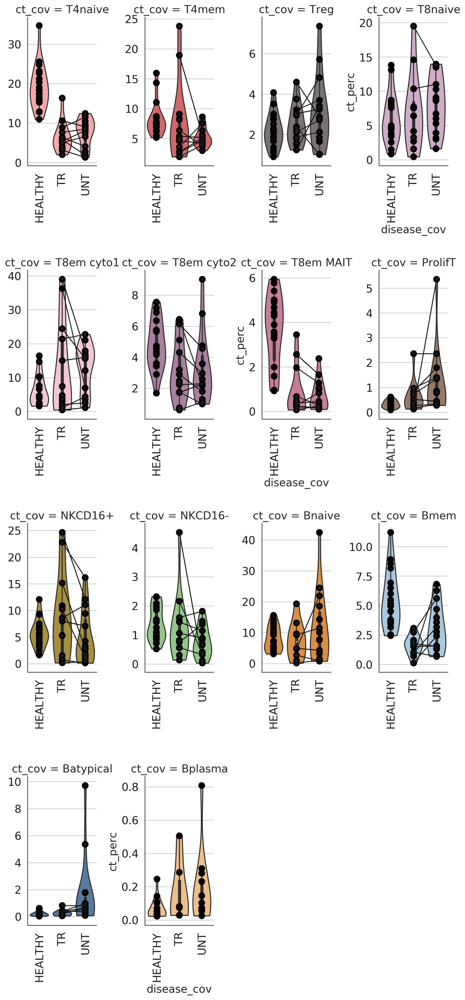

In [28]:
ORDER = ['T4naive', 'T4mem', 'Treg', 'T8naive', 'T8em cyto1', 'T8em cyto2', 'T8em MAIT', 'ProlifT', 'NKCD16+', 'NKCD16-', 'Bnaive', 'Bmem', 'Batypical', 'Bplasma',
        ]

perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col_order=ORDER, col='ct_cov', col_wrap=4, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)
for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]    
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0", scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.figure6dlymphct.png")


# Monocytes

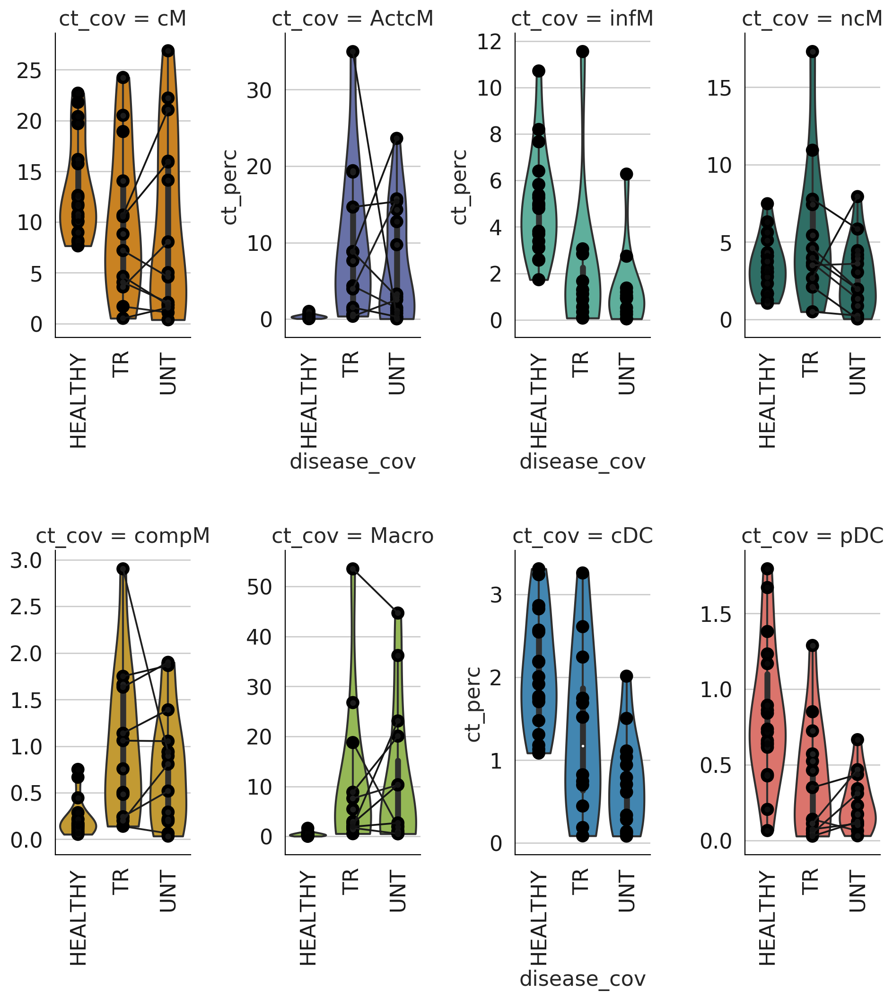

In [29]:
ORDER = ['cM','ActcM', 'infM','ncM', 'compM', 'Macro', 'cDC', 'pDC'
        ]
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col_order=ORDER, col='ct_cov', col_wrap=4, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0", scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
   
perc_plot.savefig(figdir+"/violin.figure6dmonoct.png")

# Other Cell Types

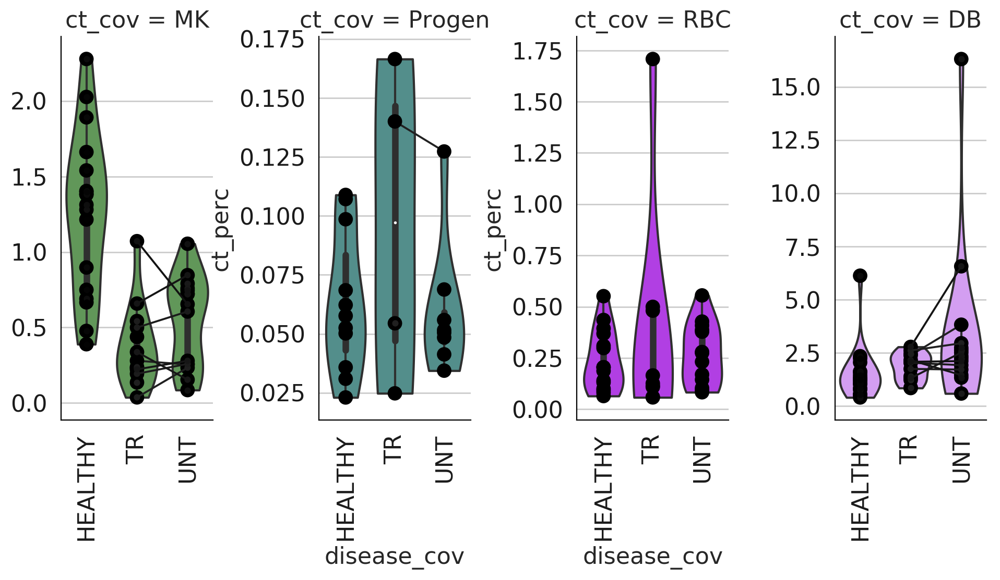

In [30]:
ORDER = ['MK', 'Progen', 'RBC', 'DB'
        ]
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col_order=ORDER, col='ct_cov', col_wrap=7, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)
for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0", scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.figure6dotherct.png")

# Map colors onto cell type labels

In [31]:
colormapping = dict()
unique_ct = adata.obs.ct_cov.cat.categories.tolist()
for ii in range(len(unique_ct)):
    colormapping[unique_ct[ii]] = adata.uns['ct_cov_colors'][ii]

In [123]:
# Atypical memory B cells
sc.pl.umap(adata, color=['CR2', 'CD27', 'FCRL5', 'ITGAX', 'NKG7'],show=False, save='.AtypicalBgenes.png')

saving figure to file ./figures./umap.AtypicalBgenes.png


In [122]:
ddata = adata[adata.obs['ct_cov']=='ProlifT']
sc.pl.violin(ddata,keys=['CD8A', 'CD3D'], groupby='disease_cov',show=False, save='.Tprolif_CD8A.png')

saving figure to file ./figures./violin.Tprolif_CD8A.png


In [34]:
## platelet effect
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, save='.platelet.png')

saving figure to file ./figures./umap.platelet.png


In [35]:
## cycling
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3, save='.cycling.png')

saving figure to file ./figures./umap.cycling.png


In [121]:
## MACROPHAGES
sc.pl.umap(adata, color=['CD163', 'HLA-DRB1', 'C1QA', 'IFITM3'], size=3, show=False, save=".MACRO.png")

saving figure to file ./figures./umap.MACRO.png


In [120]:
## CD4, CD8 and NK axis
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1", "FCGR3A", 'NKG7', 'IFNG', 'GZMB', 'PRF1'],size=3, show=False, save=".TNK.png")
# Two NK sub populations: CD56high/lowCD16high/low, CD56lowCD16high
# https://www.frontiersin.org/files/Articles/162361/fimmu-06-00567-HTML/image_m/fimmu-06-00567-g001.jpg

saving figure to file ./figures./umap.TNK.png


In [119]:
#sc.pl.violin(adata, keys= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=False, save='.T8emcyto1expression')
#sc.pl.stacked_violin(adata, keys= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=False, save='.T8emcyto1expression')
sc.pl.umap(adata, color=['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'],size=3, show=False, use_raw=True, save=".gzmbgenes.png")
sc.pl.violin(adata, keys= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=True, save='.T8emcyto1expression_raw')
#sc.pl.stacked_violin(adata, var_names= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=True, save='.T8emcyto1expression_raw')


... storing 'ct_group' as categorical


saving figure to file ./figures./umap.gzmbgenes.png
saving figure to file ./figures./violin.T8emcyto1expression_raw.png


In [44]:
## Memory vs. helper vs. naive
sc.pl.umap(adata, color=["CCR7","IL7R","S100A4","CD58", 'FAS', 'IL2RA'],size=3, save=".TMemThTNaive.png")

saving figure to file ./figures./umap.TMemThTNaive.png


In [45]:
## treg
sc.pl.umap(adata, color=["FOXP3","TNFRSF4","ENTPD1","CCR10"],size=3, save=".TREG.png")

saving figure to file ./figures./umap.TREG.png


In [46]:
## y chromosome gender effect
sc.pl.umap(adata, color=["DDX3Y", "RPS4Y1", "FHIT","TRAT1"], size =3, save=".Y.png")

saving figure to file ./figures./umap.Y.png


In [47]:
## b cells, plasmablasts and pdcs
sc.pl.umap(adata, color=["MZB1", "IGJ", "CD79A", 'CD27', 'FCRL5', 'IL6', 'FCRLA', 'FCRL3'],size=3, save=".B.png")

saving figure to file ./figures./umap.B.png


# Lymphocyte and Monocyte proportions

saving figure to file ./figures./umap.ct_group.png


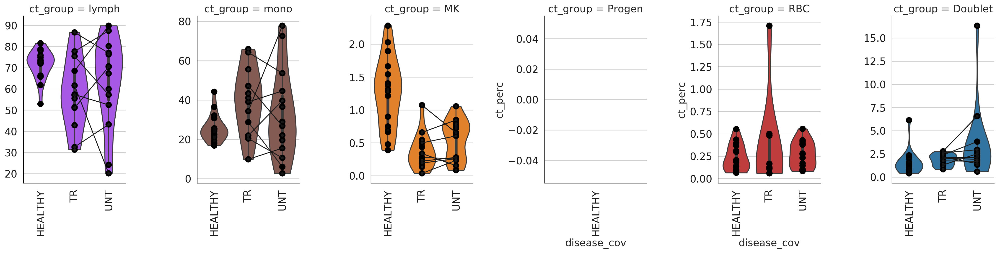

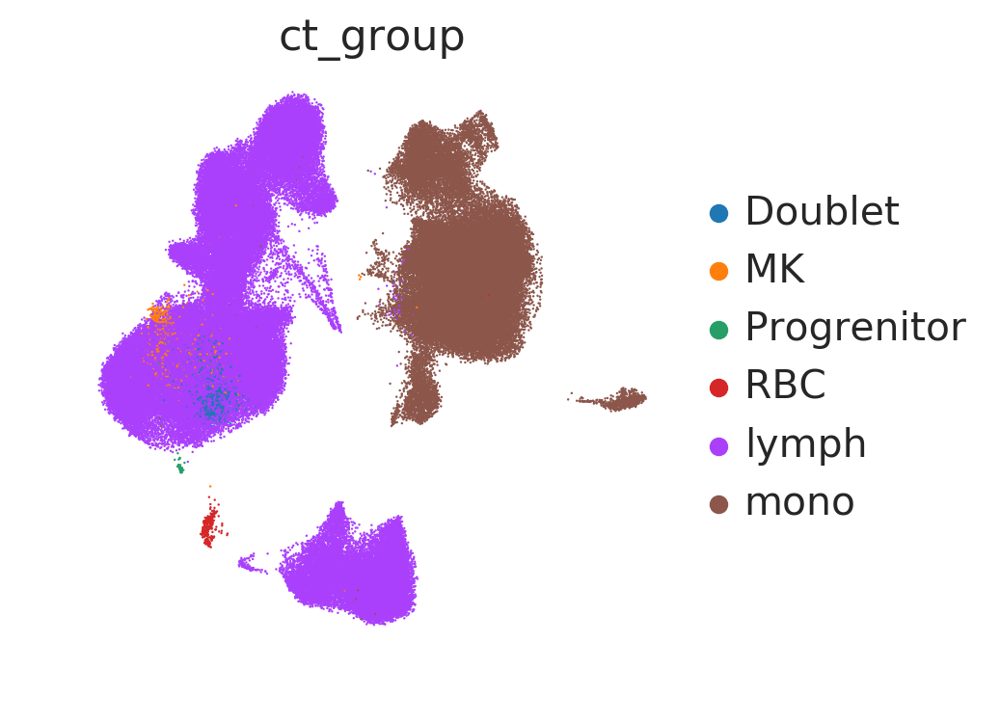

In [50]:
## Make proportion plots
adata_obs_small = adata.obs
## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_group','disease_cov', 'ind_cov'])['ct_group'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_group')
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_group = ind_perc.ct_group.astype('category')
# Reorder categories for plotting
ORDER = ['lymph', 'mono', 'MK', 'Progen', 'RBC', 'Doublet']
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_group', col_order=ORDER, data=ind_perc, kind='violin', col='ct_group', cut=0, dodge=False, aspect=0.75, sharex=False, sharey=False)

for ct_i in list(range(len(ORDER))) :
    ct = ORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_group == ct], color="0", size=10, ax=perc_plot.axes[0, ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_group == ct], color="0", scale=0.5, ax=perc_plot.axes[0,ct_i])
    except:
        continue
    perc_plot.axes[0, ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[0, ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[0, ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.ct_group.png")
sc.pl.umap(adata, color='ct_group', show=True, size=3, save='.ct_group', edgecolor="none", palette=sc.pl.palettes.vega_20_scanpy)

# Protein analysis

In [51]:
adata.obs['ct_cov_11'] = adata.obs['batch_cov'].astype("str")
# # ## do some manual cell type assignment
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "0"] = "T4" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "1"] = "B" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "2"] = "NK" ## good                                                                                     
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "3"] = "T8" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "4"] = "T8" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "5"] = "T4" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "6"] = "cM" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "7"] = "T4" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "8"] = "ncM" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "9"] = "cM" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "10"] = "T8" ## good                                                                                  
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "11"] = "cM" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "12"] = "cM" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "13"] = "B" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "14"] = "T4" ## good                                                                                  
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "15"] = "cM" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "16"] = "T8" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "17"] = "cM" ## good                                                                                  
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "18"] = "T4" ## good                                                                              
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "19"] = "DB" ## good                                                                               
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "20"] = "T8" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "21"] = "cM" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "22"] = "cDC" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "23"] = "NK" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "24"] = "B" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "25"] = "MK" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "26"] = "cM" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "27"] = "B" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "28"] = "ncM" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "29"] = "ProlifT" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "30"] = "pDC" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "31"] = "T4" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "32"] = "RBC" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "33"] = "cM" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "34"] = "T4" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "35"] = "T4" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "36"] = "B" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "37"] = "Progen" ##
adata.obs['ct_cov_11'] = adata.obs.ct_cov_11.astype('category')


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [52]:
pdata = adata.copy()
print(pdata)

AnnData object with n_obs × n_vars = 145158 × 1161 
    obs: 'SOURCE', 'TR_UNT', 'batch_cov', 'ind_cov', 'well', 'Female', 'pop_cov', 'Broad', 'CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'disease_cov', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'SDPR', 'GNG11', 'PPBP', 'PC3', 'PC16', 'louvain', 'leiden', 'site', 'disease_pop_site_cov', 'ind_cov_disease_cov', 'umap_density_disease_cov', 'ct_cov', 'ct_group', 'ct_cov_11'
    uns: 'barcodes', 'diffmap_evals', 'genes', 'leiden', 'louvain', 'neighbors', 'pca', 'raw_counts', 't

In [53]:
import anndata as ad
import combat2
import combat
import patsy
# Find antibodies
ab_names = [ab for ab in pdata.obs_keys() if 'pAbO' in ab]
print(ab_names)
obs = pd.DataFrame()
obs['disease_cov'] = pdata.obs['disease_cov']
pdata.obs['batch_cov'] = pdata.obs['batch_cov'].astype('str')
obs['batch_cov'] = pdata.obs['batch_cov']
obs['well'] = pdata.obs['well']
obs['Female'] = pdata.obs['Female']
obs['ct_cov_rna'] = pdata.obs['ct_cov']
obs['ct_cov_rna_11'] = pdata.obs['ct_cov_11']
var = pd.DataFrame(index=ab_names)
pdatapseudo = ad.AnnData(pdata.obs[ab_names].values, obs=obs, var=var, dtype='float64')
print(pdatapseudo)

# Add the total counts per cell as observations-annotation to pdatapseudo
pdatapseudo.obs['n_counts'] = np.ravel(pdatapseudo.X.sum(axis=1))
print('Normalizing total counts to 10,000')
sc.pp.normalize_per_cell(pdatapseudo, counts_per_cell_after=1e4)
print('Log transforming data')
sc.pp.log1p(pdatapseudo)
print('Making .obs into categories')
pdatapseudo.strings_to_categoricals()
sc.pp.scale(pdatapseudo, max_value=10)
## compute PCA
sc.pp.pca(pdatapseudo, random_state=1, svd_solver='arpack')
regressors = ['n_counts', 'Female'] # Add batch_cov?
print('Regressing out total nUMIs, and gender')
print('regressors: '+str(regressors))
sc.pp.regress_out(pdatapseudo, regressors)
print('Scaling expression data')
sc.pp.scale(pdatapseudo, max_value=10)


## combat adjustment                                                                                                                                                                                                           
print('Running combat')
mod = patsy.dmatrix("~ disease_cov", pdatapseudo.obs, return_type="dataframe")
mod = mod.reset_index(drop=True)
batch = pdatapseudo.obs['well']
batch = batch.reset_index(drop=True)
pdatapseudo.X = combat.combat(pdatapseudo.X.transpose(), batch=batch, model=mod).transpose();


#######################
# Louvain and friends #
#######################
# Set parameters
intialization = 1
n_components = 15
resolution = 0.5
# Run louvain clustering on theoretical future gene expression per cell
logging.info('Estimating louvain cluster identities for gene expression values.')
sc.pp.pca(pdatapseudo ,random_state=intialization, svd_solver='arpack')
logging.info('PCA complete.')
sc.pp.neighbors(pdatapseudo, n_pcs=15, use_rep='X_pca', random_state=intialization)
#sc.pp.neighbors(pdatapseudo, random_state=intialization)
logging.info('KNN complete.')
sc.tl.leiden(pdatapseudo, random_state=intialization, resolution=resolution)
logging.info('Leiden complete.')
sc.tl.umap(pdatapseudo, spread=2, random_state=intialization)
logging.info('UMAP complete.')
logging.info('Making .obs into categories')
pdatapseudo.strings_to_categoricals()
logging.info('Basic analysis complete.')

['CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO']


Up to anndata 0.6.12, `.copy()` cast a non-'float32' `.X` to 'float32'. Now, the dtype 'float64' is maintained. 


AnnData object with n_obs × n_vars = 145158 × 20 
    obs: 'disease_cov', 'batch_cov', 'well', 'Female', 'ct_cov_rna', 'ct_cov_rna_11'
Normalizing total counts to 10,000
Log transforming data
Making .obs into categories


... storing 'batch_cov' as categorical


computing PCA with n_comps = 50
    finished (0:00:00.49)
Regressing out total nUMIs, and gender
regressors: ['n_counts', 'Female']
regressing out ['n_counts', 'Female']
    finished (0:00:01.58)
Scaling expression data
Running combat


found 12 batches
found 0 numerical covariates...
found 2 categorical variables:	disease_cov[T.TR], disease_cov[T.UNT]
Standardizing Data across genes.
Fitting L/S model and finding priors
Finding parametric adjustments


Adjusting data
computing PCA with n_comps = 50
    finished (0:00:00.13)
computing neighbors
    finished (0:00:49.26)
running Leiden clustering
    finished (0:01:32.24)
computing UMAP
    finished (0:03:25.39)


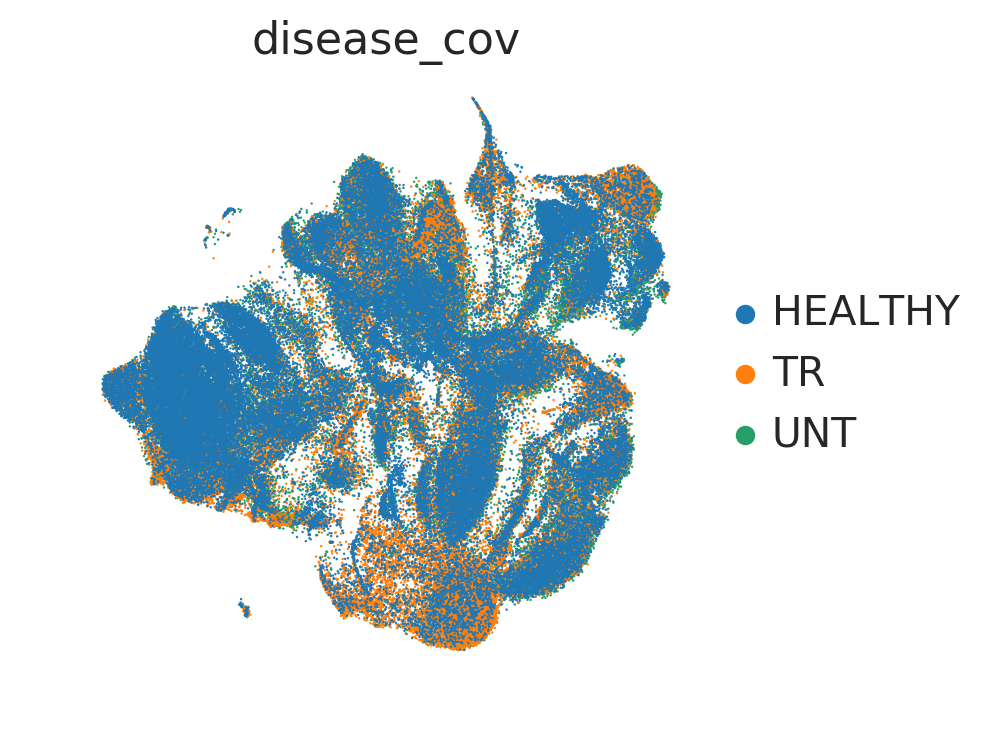

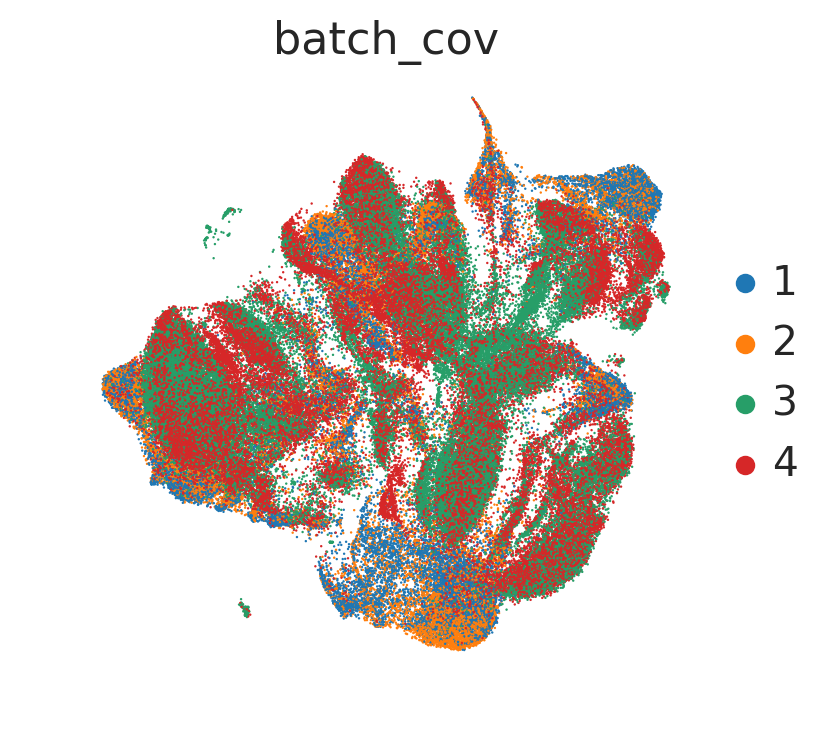

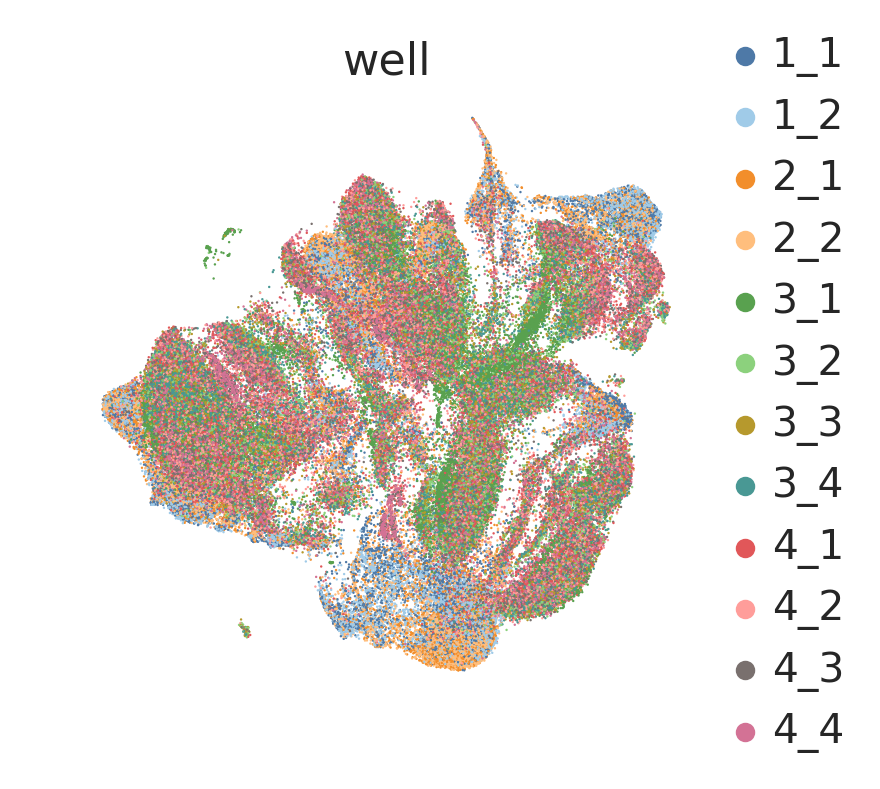

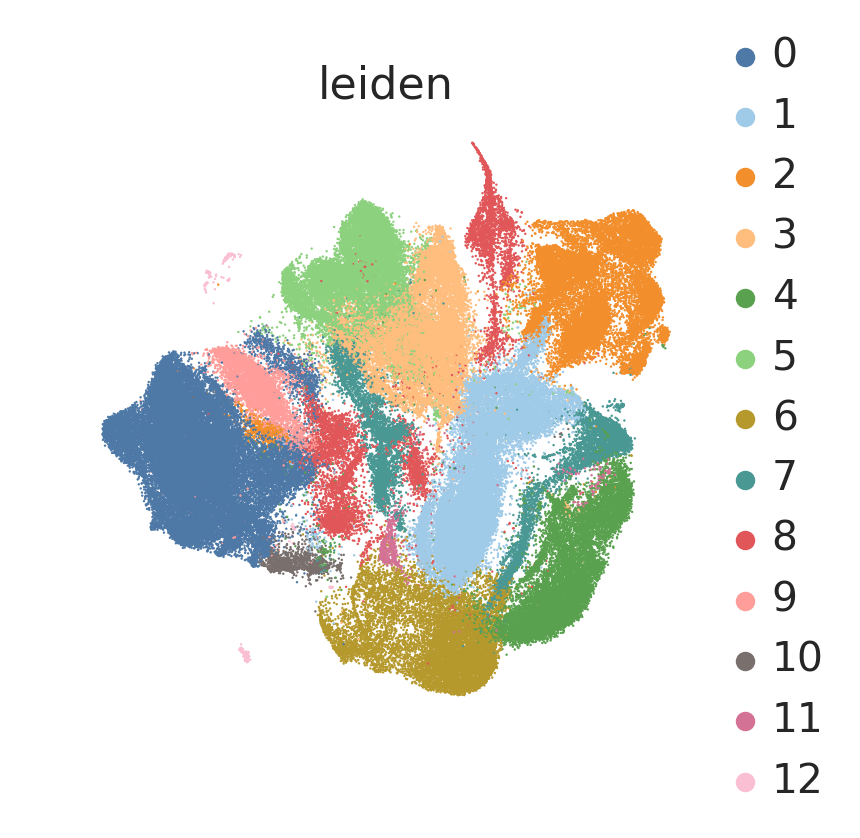

saving figure to file ./figures./umap.ab_ct_cov_figure6e.png


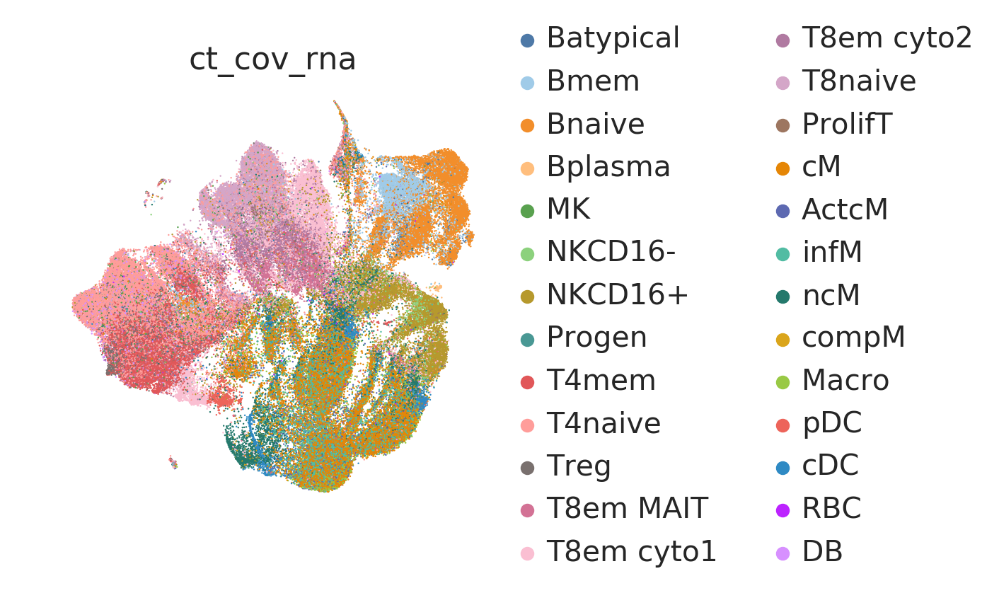

saving figure to file ./figures./umap.ab_ct_cov_11_figure6e.png


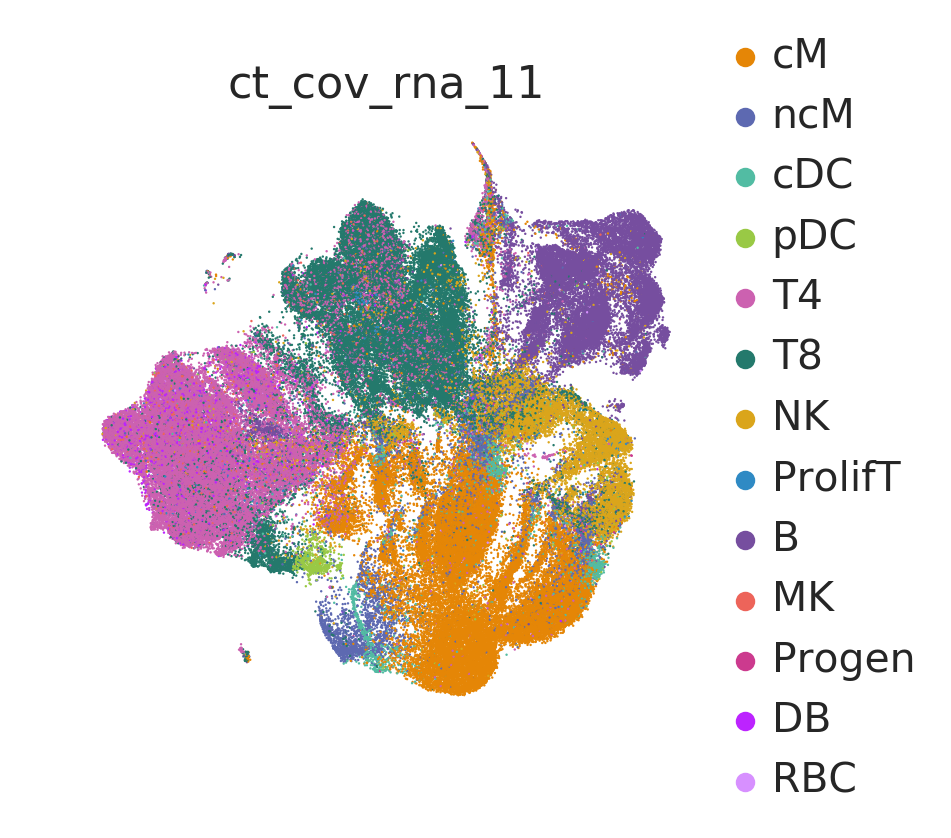

In [54]:
sc.pl.umap(pdatapseudo, color='disease_cov', show=True, size=3, edgecolor="none")
sc.pl.umap(pdatapseudo, color='batch_cov', show=True, size=3, edgecolor="none")
sc.pl.umap(pdatapseudo, color='well', show=True, size=3, edgecolor="none", palette=colorrs)
sc.pl.umap(pdatapseudo, color='leiden', show=True, size=3, edgecolor="none", palette=colorrs)
sc.pl.umap(pdatapseudo, color='ct_cov_rna', show=True, size=3, edgecolor="none", palette=colorrs, save=".ab_ct_cov_figure6e.png")

MasterORDER = ['cM', 'ncM', 'cDC', 'pDC', 'T4', 'T8', 'NK', 'ProlifT', 'B', 'MK', 'Progen', 'DB', 'RBC']
colorrs = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E",'#BC23FF', '#D790FF']
pdatapseudo.obs['ct_cov_rna_11'] = pdatapseudo.obs['ct_cov_rna_11'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_rna_11_colors'] = colorrs
sc.pl.umap(pdatapseudo, color='ct_cov_rna_11', show=True, size=3, edgecolor="none", palette=colorrs, save=".ab_ct_cov_11_figure6e.png")


# Most abundant antibodies in antibody clustered communities

In [55]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(pdatapseudo.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = pdatapseudo.var_names[np.flipud(np.argsort(np.mean(pdatapseudo.X[pdatapseudo.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.head(5)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12
0,CD4|CD4|j95-14|pAbO,CD14|CD14|j95-20|pAbO,CD19|CD19|j95-10|pAbO,CD8|CD8A|j95-25|pAbO,HLA-DR|CD74|j95-18|pAbO,CD8|CD8A|j95-25|pAbO,CD14|CD14|j95-20|pAbO,CD183|CXCR3|j95-12|pAbO,CD197|CCR7|j95-09|pAbO,CD183|CXCR3|j95-12|pAbO,CD4|CD4|j95-14|pAbO,CD38|CD38|j95-01|pAbO,CD183|CXCR3|j95-12|pAbO
1,CD27|CD27|j95-08|pAbO,CD38|CD38|j95-01|pAbO,CD185|CXCR5|j95-22|pAbO,CD3|CD3E|j95-16|pAbO,CD38|CD38|j95-01|pAbO,CD45RA|PTPRC|j95-28|pAbO,CD38|CD38|j95-01|pAbO,CD38|CD38|j95-01|pAbO,CD127|IL7R|j95-27|pAbO,CD4|CD4|j95-14|pAbO,CD45RA|PTPRC|j95-28|pAbO,HLA-DR|CD74|j95-18|pAbO,CD45RA|PTPRC|j95-28|pAbO
2,CD28|CD28|j95-07|pAbO,CD161|KLRB1|j95-11|pAbO,CD196|CCR6|j95-17|pAbO,CD27|CD27|j95-08|pAbO,CD14|CD14|j95-20|pAbO,CD27|CD27|j95-08|pAbO,HLA-DR|CD74|j95-18|pAbO,CD161|KLRB1|j95-11|pAbO,CD194|CCR4|j95-21|pAbO,CD27|CD27|j95-08|pAbO,CD3|CD3E|j95-16|pAbO,CD14|CD14|j95-20|pAbO,CD4|CD4|j95-14|pAbO
3,CD3|CD3E|j95-16|pAbO,CD194|CCR4|j95-21|pAbO,CD45RA|PTPRC|j95-28|pAbO,CD28|CD28|j95-07|pAbO,CD161|KLRB1|j95-11|pAbO,CD183|CXCR3|j95-12|pAbO,CD45RO|PTPRC|j95-19|pAbO,CD95|FAS|j95-02|pAbO,CD45RO|PTPRC|j95-19|pAbO,CD28|CD28|j95-07|pAbO,CD183|CXCR3|j95-12|pAbO,CD95|FAS|j95-02|pAbO,CD27|CD27|j95-08|pAbO
4,CD127|IL7R|j95-27|pAbO,CD45RO|PTPRC|j95-19|pAbO,CD38|CD38|j95-01|pAbO,CD95|FAS|j95-02|pAbO,CD194|CCR4|j95-21|pAbO,CD3|CD3E|j95-16|pAbO,CD4|CD4|j95-14|pAbO,CD14|CD14|j95-20|pAbO,CD161|KLRB1|j95-11|pAbO,CD3|CD3E|j95-16|pAbO,HLA-DR|CD74|j95-18|pAbO,CD161|KLRB1|j95-11|pAbO,CD3|CD3E|j95-16|pAbO


# Add antibody leiden and umap coordinates to pdata structure

In [79]:
pdata.obs['leiden'] = pdatapseudo.obs['leiden']
pdata.obsm['X_umap'] = pdatapseudo.obsm['X_umap']

#for ab in ab_names:
#    pdata.obs[ab] = pdatapseudo.X[:, pdatapseudo.var_names==ab]

# Annotate antibody clustered communities

In [57]:
pdata.obs['ct_cov_ab'] = adata.obs['batch_cov'].astype("str")
# # ## do some manual cell type assignment
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "0"] = "T4" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "1"] = "Myeloid" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "2"] = "B" ## good                                                                                     
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "3"] = "T8" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "4"] = "Myeloid" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "5"] = "T8" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "6"] = "Myeloid" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "7"] = "NK" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "8"] = "T4" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "9"] = "T4" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "10"] = "T4" ## good                                                                                  
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "11"] = "Myeloid" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "12"] = "T4" ## good   

pdata.obs['ct_cov_ab'] = pdata.obs['ct_cov_ab'].astype('category')


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [112]:
abneo = []
for ab in ab_names:
    abneo.append(ab.split('|')[1])
for ii in range(len(ab_names)):
    try:
        print(abneo[ii])
        print(stats.spearmanr(np.ravel(ppdata.X[:, pdata.var_names==abneo[ii]].tolist()), pdata.obs[ab_names[ii]].tolist()))
    except:
        continue


CD38
SpearmanrResult(correlation=0.09729841926810248, pvalue=3.2339291096822986e-302)
FAS
CD28
CD27
SpearmanrResult(correlation=0.21160507797262293, pvalue=0.0)
CCR7
SpearmanrResult(correlation=0.04987146580120267, pvalue=1.3439524331739848e-80)
CD19
SpearmanrResult(correlation=0.09952112436122046, pvalue=0.0)
KLRB1
SpearmanrResult(correlation=0.21303536410949622, pvalue=0.0)
CXCR3
CD4
CD3E
SpearmanrResult(correlation=0.12125601188591936, pvalue=0.0)
CCR6
SpearmanrResult(correlation=0.10516314816218206, pvalue=0.0)
CD74
PTPRC
CD14
SpearmanrResult(correlation=0.40676086960224006, pvalue=0.0)
CCR4
CXCR5
SpearmanrResult(correlation=0.06475319556384965, pvalue=1.1685290292048653e-134)
IL2RA
SpearmanrResult(correlation=0.15255235710671777, pvalue=0.0)
CD8A
SpearmanrResult(correlation=0.30686028484532435, pvalue=0.0)
IL7R
SpearmanrResult(correlation=0.1928852816371276, pvalue=0.0)
PTPRC


# Most expressed genes in antibody clustered communities

In [118]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(pdata.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = pdata.var_names[np.flipud(np.argsort(np.mean(pdata.X[pdata.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.head(10)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12
0,IL7R,TYROBP,CD79A,CCL5,TYROBP,RP11-291B21.2,CSTA,KLRF1,IL7R,IL7R,LILRA4,TYROBP,FCER1A
1,TRAT1,FCER1G,MS4A1,NKG7,FCER1G,CD8B,CST3,GNLY,BCL11B,TRAT1,SERPINF1,TMEM176B,TNFSF10
2,MAL,CST3,CD79B,CD8A,MNDA,CCR7,FCN1,PRF1,IL32,MAL,TPM2,LST1,HES4
3,CD3E,LST1,BANK1,GZMA,CST3,CD8A,MNDA,GZMB,IFI44L,TSHZ2,PTCRA,CTSS,CLEC10A
4,IL32,FCN1,LINC00926,GZMH,CSTA,NUCB2,TYROBP,NKG7,TXNIP,PRKCQ-AS1,IL3RA,CSTA,MT2A
5,PRKCQ-AS1,CTSS,TCL1A,IL32,VCAN,IL7R,AIF1,CTSW,TRAT1,LEF1,PLD4,AIF1,IFI30
6,TSHZ2,AIF1,VPREB3,CD8B,FCN1,LEF1,LST1,TYROBP,MAL,CD3E,SCT,CST3,CD68
7,CD40LG,MNDA,RALGPS2,CST7,S100A12,CD27,CTSS,CST7,ITM2A,CD3G,CLEC4C,NAMPT,SERPINA1
8,CD3G,CSTA,HLA-DRA,GZMK,CTSS,CD3E,FCER1G,SPON2,CD3E,CD27,LRRC26,NEAT1,PTGDS
9,LEF1,S100A11,HLA-DQA1,DUSP2,LST1,S100B,TYMP,GZMA,CD3G,IL32,PPP1R14B,TMEM176A,CDKN1C


... storing 'batch_cov' as categorical


saving figure to file ./figures./umap.ab_ct_cov_figure6e.png


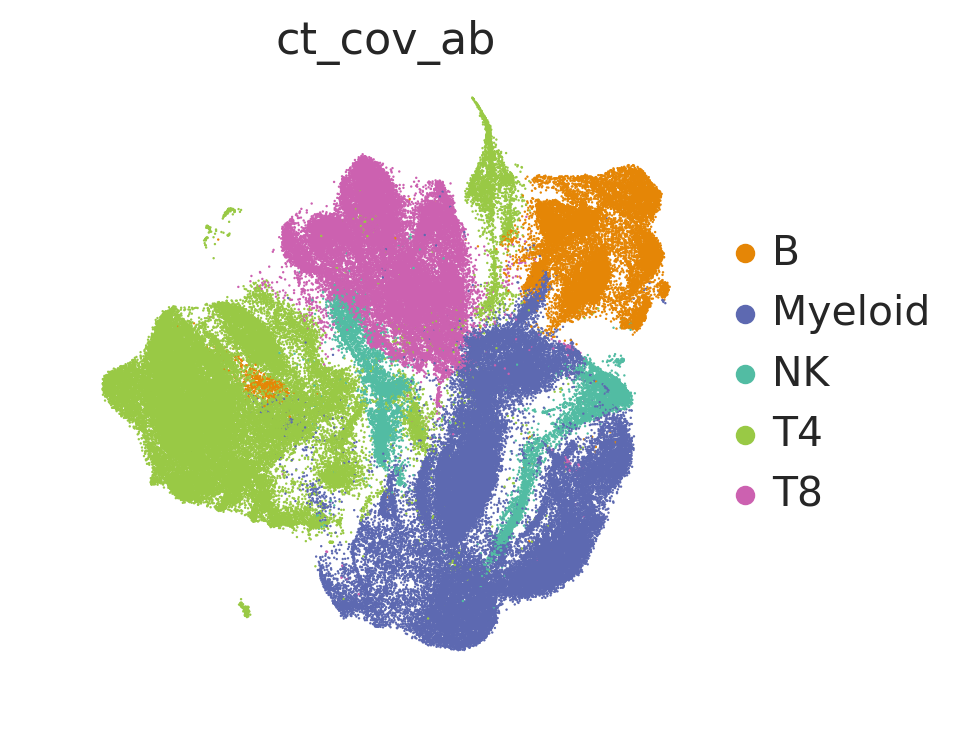

In [59]:

sc.pl.umap(pdata, color='ct_cov_ab', show=True, size=3, edgecolor="none", palette=colorrs, save=".ab_ct_cov_figure6e.png")


# T Cyto 1 pop feature plots

In [116]:
sc.pl.umap(pdata, color=['CD8A', 'CD4', 'GZMB', 'SERPINF1', 'DNASE1L3'], show=False, size=3, edgecolor="none", palette=colorrs, save=".figure6e_ab_umap_cyto1featureplots.png")


... storing 'ct_group' as categorical


saving figure to file ./figures./umap.figure6e_ab_umap_cyto1featureplots.png


# Statistics

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY COUNTS


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Beta,Cell,Pval
0,1.4918057905895816,B,0.394179
1,-15.40941246668386,Myeloid,5.33841e-06
2,-3.8316597113186948,NK,0.0121049
3,14.19669890366568,T4,0.000188192
4,-5.553411705372735,T8,0.13527


as a proportion of total PBMC: Healthy vs. Untreated WEIGHTED BY COUNTS


,Beta,Cell,Pval
0,-5.924033423215642,B,0.0750859
1,-8.473866073119117,Myeloid,0.0270224
2,-2.2425420140940013,NK,0.035542
3,12.613863640596461,T4,0.000599772
4,-6.54101116671474,T8,0.00326001


as a proportion of total PBMC: Treated vs. Untreated WEIGHTED BY COUNTS


,Beta,Cell,Pval
0,-7.4158392138052225,B,0.0810671
1,6.935546393564737,Myeloid,0.123
2,1.5891176972246965,NK,0.409837
3,-1.5828352630692102,T4,0.50093
4,-0.9875994613420023,T8,0.800285


as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY COUNTS


,Beta,Cell,Pval
0,-2.9095051691332467,B,0.269151
1,-12.495273907163615,Myeloid,0.000266585
2,-3.100912212215917,NK,0.0162393
3,13.403740503436538,T4,1.35022e-06
4,-6.116421770486729,T8,0.0259055


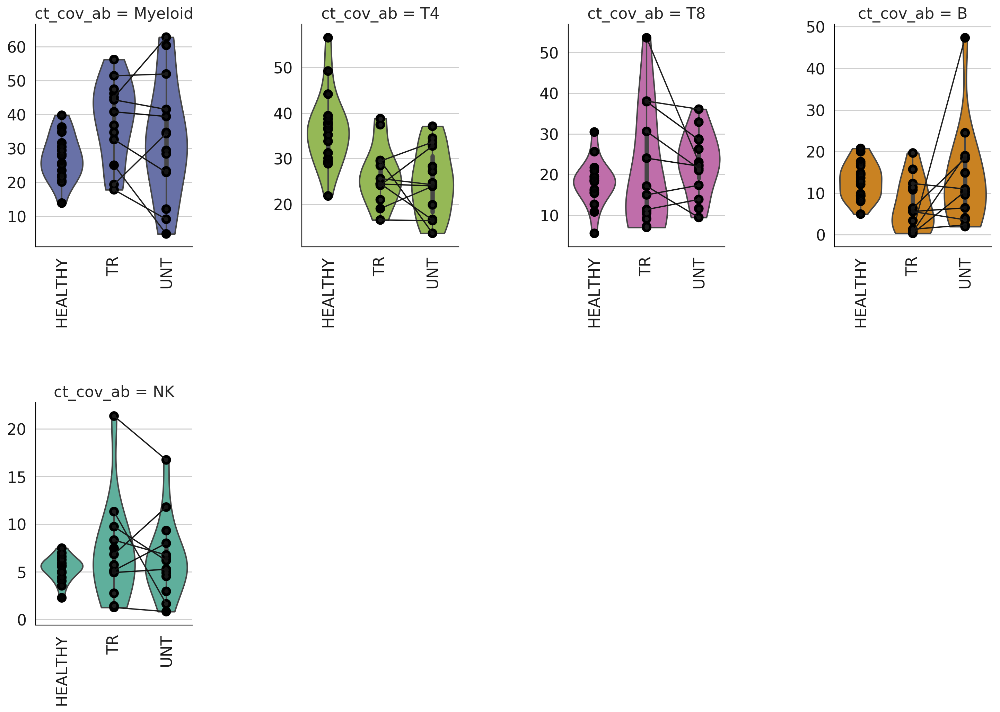

In [61]:
## Make proportion plots
pdata_obs_small = pdata.obs
ind_count = pdata_obs_small.groupby(['ind_cov_disease_cov','ct_cov_ab','disease_cov','pop_cov', 'ind_cov'])['ct_cov_ab'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {  'ct_cov_ab':['T8cytol.a', 'T8cytol.b', 'pDC', 'iM',   'compM', 'NKCD16-', 'NKCD16+', 'Batypical', 'DB',      'Progrenitor',  'Th',    'Bplasma', 'Bmem',  'Bnaive', 'cM',   'ncM',  'iM',  'T4naive', 'Macro', 'T4mem', 'T8mem', 'T8em cyto1','T4IFN', 'T8em cyto2', 'T8em cyto3', 'T8naive', 'Treg',  'NK',    'TProlif', 'Tc1q+', 'cDC', 'RBC'], 
                          'ct_group':['lymph',   'lymph', 'mono', 'mono', 'mono',  'lymph',   'lymph',   'lymph',     'Doublet', 'Progrenitor',  'lymph', 'lymph',   'lymph', 'lymph',  'mono', 'mono', 'mono','lymph',   'mono',  'lymph', 'lymph', 'lymph',     'lymph', 'lymph',      'lymph',      'lymph',   'lymph', 'lymph', 'lymph',   'lymph', 'mono','RBC']})

# Add cell type macrogroup as observation
pdata.obs['ct_group'] = pdata.obs['ct_cov_ab'].tolist()
celltypes = np.unique(cg_cov['ct_cov_ab'].tolist())

for ii in range(len(celltypes)):
    pdata.obs['ct_group'][pdata.obs['ct_cov_ab']==cg_cov['ct_cov_ab'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov_ab').join(cg_cov.set_index('ct_cov_ab'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov_ab = ind_perc.ct_cov_ab.astype('category')
ind_perc.ct_cov_ab = ind_perc.ct_cov_ab.cat.reorder_categories(pdata.obs.ct_cov_ab.cat.categories.values)


ORDER = ['Myeloid', 'T4', 'T8','B', 'NK']
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov_ab', data=ind_perc, kind='violin', col_order=ORDER, col='ct_cov_ab', col_wrap=4, cut=0, dodge=False, aspect=0.75, sharex=False, sharey=False, palette=colorrs)
for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov_ab == ct], color="0", size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov_ab == ct], color="0", scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.ct_cov_ab_figure6e.png")

def highlight(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    # bonferroni correction
    #sig = data < (0.05/len(data))
    sig = data < (0.05/3)
    return [attr if v else '' for v in sig]

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'TR'])]
for ct_i in list(range(len(ind_perc0.ct_cov_ab.cat.categories))):
    ct = ind_perc0.ct_cov_ab.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov_ab==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov_ab==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov_ab==ct]
    disease = disease.astype("str")
    disease.values[disease=="TR"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Untreated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov_ab.cat.categories))):
    ct = ind_perc0.ct_cov_ab.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov_ab==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov_ab==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov_ab==ct]
    disease = disease.astype("str")
    disease.values[disease=="UNT"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)


# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Untreated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['TR', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov_ab.cat.categories))):
    ct = ind_perc0.ct_cov_ab.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov_ab==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov_ab==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov_ab==ct]
    disease = disease.astype("str")
    disease.values[disease=="UNT"] = 0
    disease.values[disease=="TR"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'TR', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov_ab.cat.categories))):
    ct = ind_perc0.ct_cov_ab.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov_ab==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov_ab==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov_ab==ct]
    disease = disease.astype("str")
    disease.values[disease!="HEALTHY"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

# Analysis of two T8em cyto 1 populations

... storing 'ct_group' as categorical


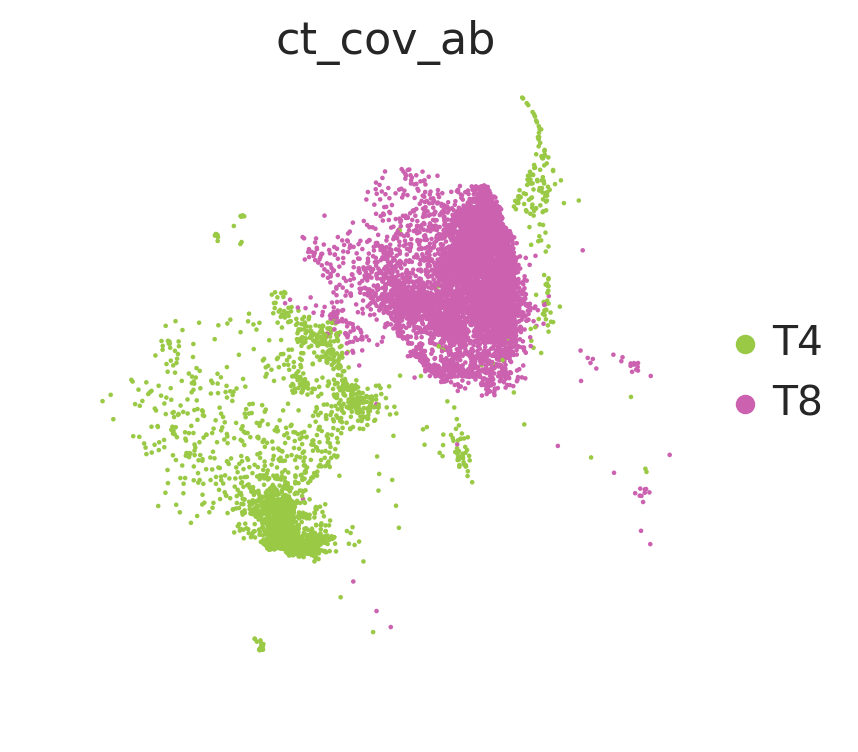

ranking genes


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


    finished (0:00:00.50)


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


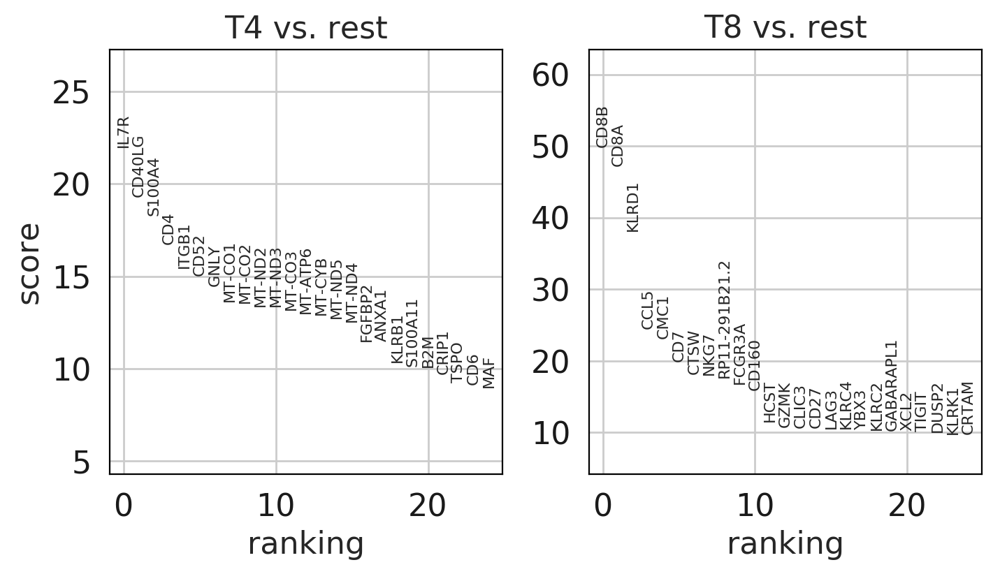

In [62]:
T8emctyo1 = pdata[(pdata.obs['ct_cov_ab'].isin(['T4','T8'])) & (pdata.obs['ct_cov']=='T8em cyto1')]
sc.pl.umap(T8emctyo1, color='ct_cov_ab', show=True)
sc.tl.rank_genes_groups(T8emctyo1, 'ct_cov_ab', method='t-test')
sc.pl.rank_genes_groups(T8emctyo1, n_genes=25, sharey=False)
CD4cyto1list = T8emctyo1[T8emctyo1.obs['ct_cov_ab']=='T4'].obs_names.tolist()
# Modify mRNA annotation with new information from protein analysis
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype("str")
adata.obs['ct_cov'][adata.obs_names.isin(CD4cyto1list)] = 'T4em cyto1'
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')

saving figure to file ./figures./umap.figure6fa.png


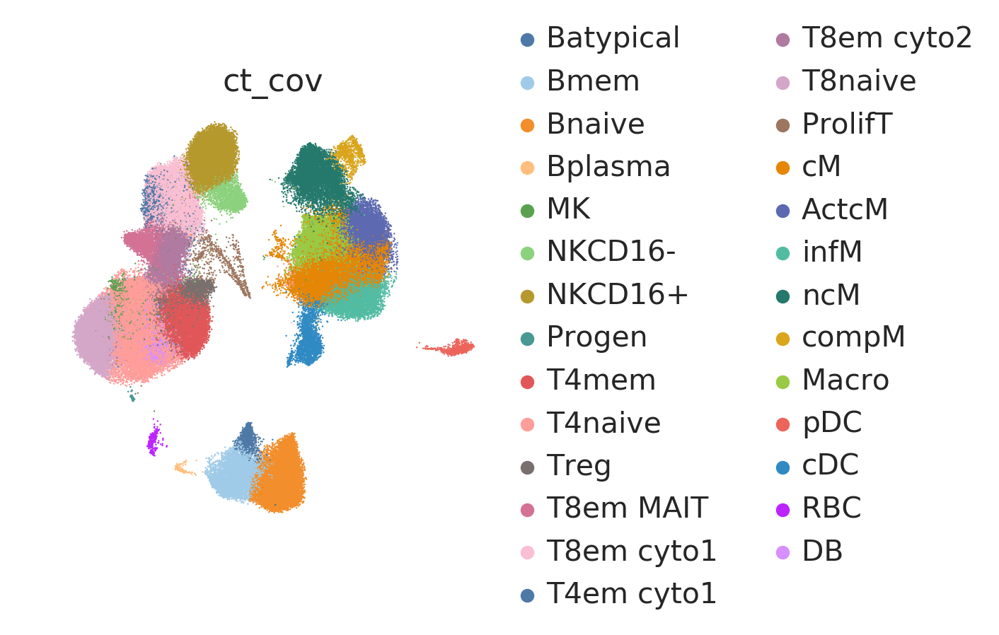

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [ ]:
MasterORDER = ['Batypical', 'Bmem', 'Bnaive', 'Bplasma', 'MK', 'NKCD16-', 'NKCD16+', 'Progen', 'T4mem', 'T4naive', 'Treg', 'T8em MAIT', 'T8em cyto1', 'T4em cyto1', 'T8em cyto2', 'T8naive', 'ProlifT', 'cM', 'ActcM', 'infM', 'ncM', 'compM', 'Macro', 'pDC', 'cDC', 'RBC', 'DB']
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#59A14F","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E","#D37295","#FABFD2",'#4E79A7',
           "#B07AA1","#D4A6C8","#9D7660",
                 "#E58606", "#5D69B1", "#52BCA3", "#24796C", '#DAA51B', '#99C945', '#ED645A', '#2F8AC4', '#BC23FF', '#D790FF']

adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', size=3, show=True, edgecolor="none", save='.figure6fa.png', palette=colorrs)

## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov','disease_cov','pop_cov', 'ind_cov'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {    'ct_cov':['ActcM','pDC', 'infM',   'compM', 'NKCD16-', 'NKCD16+', 'Batypical', 'DB',      'Progen',  'Th',    'Bplasma', 'Bmem',  'Bnaive', 'cM',   'ncM',  'iM',  'T4naive', 'Macro', 'T4mem', 'T8mem', 'T8em cyto1', 'T4em cyto1','T4IFN', 'T8em cyto2', 'T8em MAIT', 'T8naive', 'Treg',  'NK',    'ProlifT', 'Tc1q+', 'cDC', 'RBC'], 
                          'ct_group':['mono','mono', 'mono', 'mono',  'lymph',   'lymph',   'lymph',     'Doublet', 'Progrenitor',  'lymph', 'lymph',   'lymph', 'lymph',  'mono', 'mono', 'mono','lymph',   'mono',  'lymph', 'lymph', 'lymph', 'lymph',    'lymph', 'lymph',      'lymph',      'lymph',   'lymph', 'lymph', 'lymph',   'lymph', 'mono','RBC']})

# Add cell type macrogroup as observation
adata.obs['ct_group'] = adata.obs['ct_cov'].tolist()
celltypes = np.unique(cg_cov['ct_cov'].tolist())
for ii in range(len(celltypes)):
    adata.obs['ct_group'][adata.obs['ct_cov']==cg_cov['ct_cov'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

def highlight(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    # bonferroni correction
    #sig = data < (0.05/len(data))
    sig = data < (0.05/3)
    return [attr if v else '' for v in sig]

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'TR'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="TR"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Untreated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="UNT"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)


# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Untreated WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['TR', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="UNT"] = 0
    disease.values[disease=="TR"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['HEALTHY', 'TR', 'UNT'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.counts[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="HEALTHY"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    s = all_out.style.apply(highlight,subset='Pval')
display(s)


ORDER = ['T4naive', 'T4mem', 'Treg', 'T8naive', 'T8em cyto1', 'T4em cyto1', 'T8em cyto2', 'T8em MAIT', 'ProlifT', 'NKCD16+', 'NKCD16-', 'Bnaive', 'Bmem', 'Batypical', 'Bplasma',
        ]

perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col_order=ORDER, col='ct_cov', col_wrap=4, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)
for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]    
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0", scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.9, hspace = 0.9)
    
perc_plot.savefig(figdir+"/violin.figure6fb.png")


# Protein abundance for antibody clustering

In [64]:
pdata_obs_small = pdata.obs;
keys = pdata_obs_small.keys().tolist()
antibodykeys = [key for key in keys if 'pAbO' in key]
print('Ab keys')
print(antibodykeys)

for key in antibodykeys:
    sc.pl.umap(pdatapseudo, color=key,size=2, show=False, vmin=1, vmax=2, save=str(key + '.antibody_abclustering.png'))
    
    

Ab keys
['CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO']
saving figure to file ./figures./umapCD38|CD38|j95-01|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD95|FAS|j95-02|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD28|CD28|j95-07|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD27|CD27|j95-08|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD197|CCR7|j95-09|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD19|CD19|j95-1

# Feature plot antibody expression on mRNA UMAP

In [65]:
pdatapseudo.obsm['X_umap'] = adata.obsm['X_umap']
pdata_obs_small = pdata.obs;
keys = pdata_obs_small.keys().tolist()
antibodykeys = [key for key in keys if 'pAbO' in key]
print('Ab keys')
print(antibodykeys)
for key in antibodykeys:
    sc.pl.umap(pdatapseudo, color=key,size=2, show=False, vmin=1, vmax=2, save=str(key + '.antibody.png'))
    
    

Ab keys
['CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO']
saving figure to file ./figures./umapCD38|CD38|j95-01|pAbO.antibody.png
saving figure to file ./figures./umapCD95|FAS|j95-02|pAbO.antibody.png
saving figure to file ./figures./umapCD28|CD28|j95-07|pAbO.antibody.png
saving figure to file ./figures./umapCD27|CD27|j95-08|pAbO.antibody.png
saving figure to file ./figures./umapCD197|CCR7|j95-09|pAbO.antibody.png
saving figure to file ./figures./umapCD19|CD19|j95-10|pAbO.antibody.png
saving figure to file ./figures./umapCD161|KL

100.00000000000001
100.00000000000001
100.00000000000001
100.0


,ind_cov_disease_cov,ct_perc1,counts1,ind_cov_disease_cov,ct_perc2,counts2,ind_cov_disease_cov,ct_perc3,counts3,ind_cov_disease_cov,ct_perc4,counts4
ct_cov,,,,,,,,,,,,
ActcM,1240TR,1.031434,21.0,1240TR,0.107991,2,1240TR,1.626016,54,1240TR,1.387472,68.0
Batypical,1240TR,0.196464,4.0,1240TR,0.161987,3,1240TR,0.030111,1,1240TR,0.102020,5.0
Bmem,1240TR,2.603143,53.0,1240TR,2.537797,47,1240TR,2.077687,69,1240TR,1.632320,80.0
Bnaive,1240TR,11.836935,241.0,1240TR,13.552916,251,1240TR,9.334538,310,1240TR,6.672108,327.0
DB,1240TR,1.031434,21.0,1240TR,0.809935,15,1240TR,1.174345,39,1240TR,0.550908,27.0
MK,1240TR,0.294695,6.0,1240TR,0.377970,7,1240TR,0.572117,19,1240TR,0.428484,21.0
Macro,1240TR,0.245580,5.0,1240TR,0.053996,1,1240TR,0.722674,24,1240TR,0.714140,35.0
NKCD16+,1240TR,5.599214,114.0,1240TR,5.723542,106,1240TR,15.356820,510,1240TR,12.017956,589.0
NKCD16-,1240TR,0.589391,12.0,1240TR,1.133909,21,1240TR,2.288467,76,1240TR,1.387472,68.0


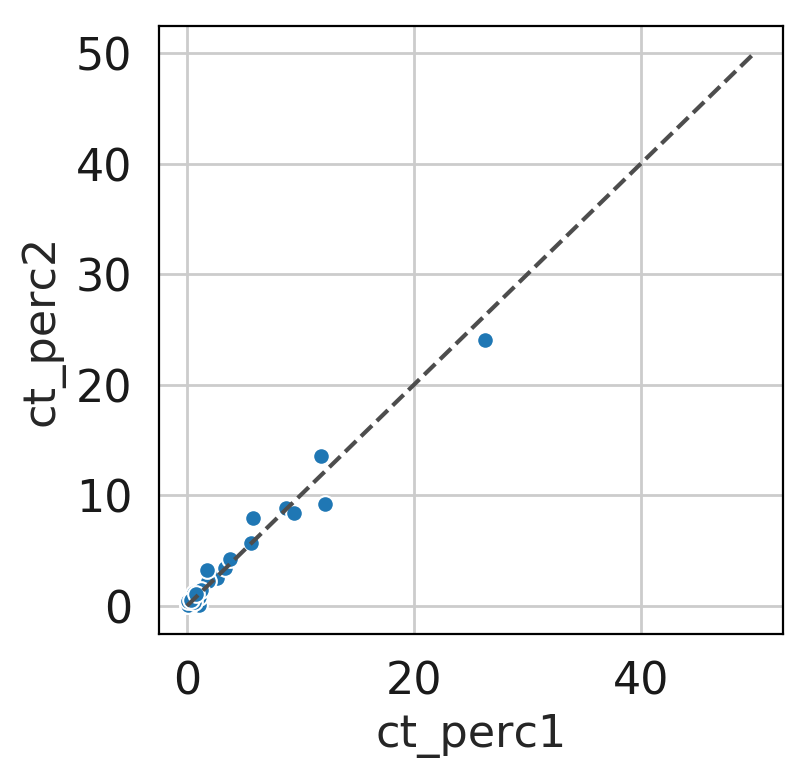

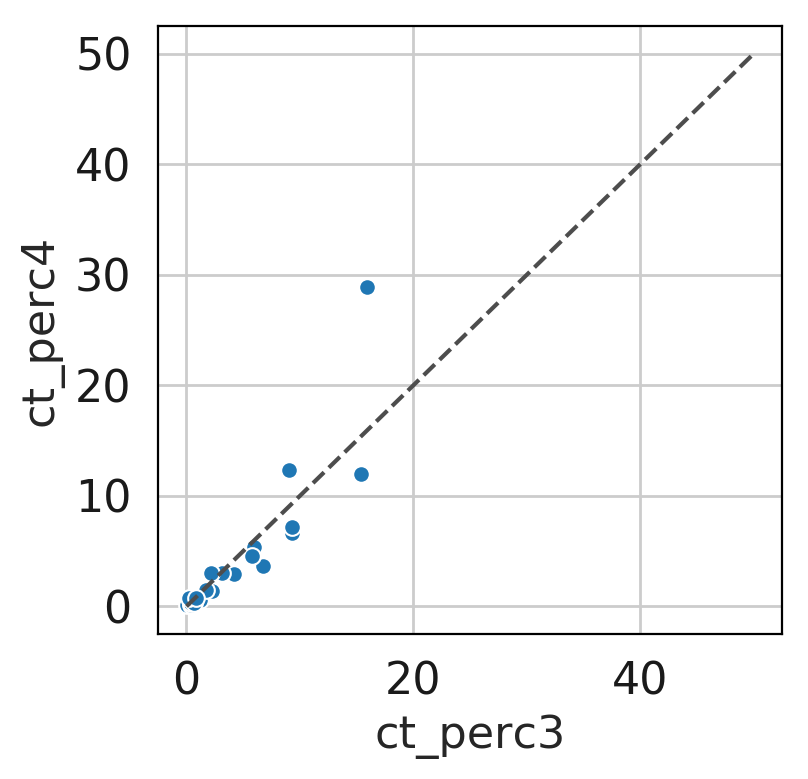

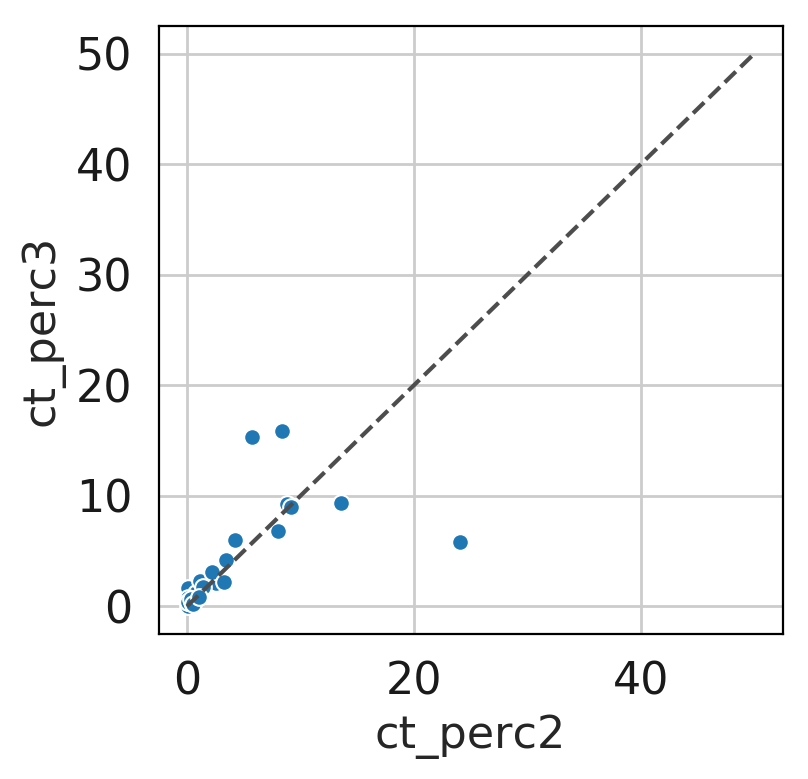

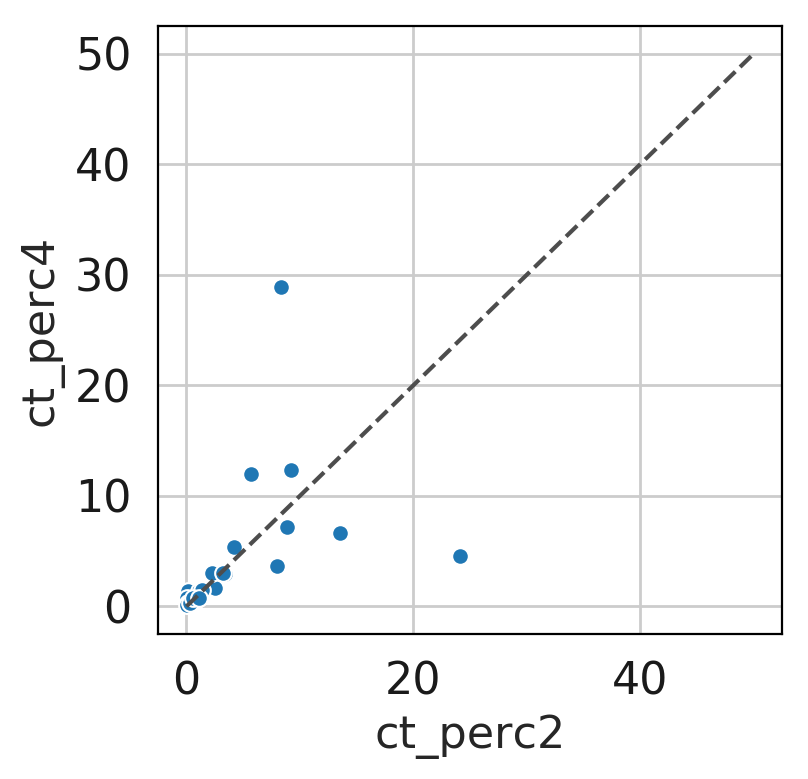

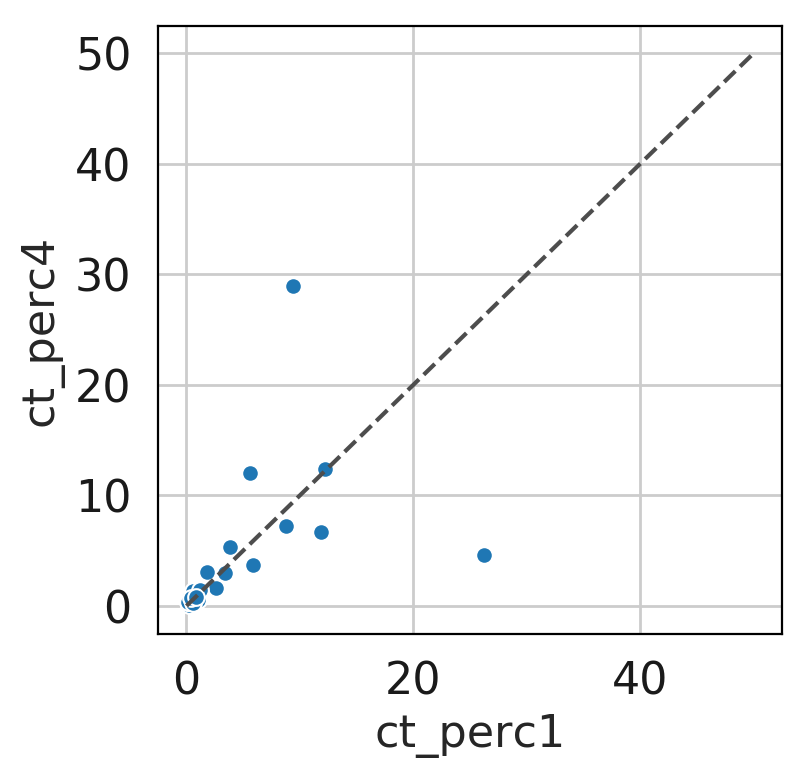

In [70]:
# Break out by batch and do proportions within batch
batch = ['1', '2', '3', '4']
## Make proportion plots
adata_obs_small0 = adata.obs
adata_obs_small0 = adata_obs_small0[adata_obs_small0.ind_cov_disease_cov == '1240TR']
# batch 1
adata_obs_small = adata_obs_small0[adata_obs_small0.batch_cov == '1']
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov'])['ct_cov'].count()
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc1")
ind_perc['counts1'] = ind_count.values.tolist()

ind_perc_batch1 = ind_perc

# batch 2
adata_obs_small = adata_obs_small0[adata_obs_small0.batch_cov == '2']
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov'])['ct_cov'].count()
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc2")
ind_perc['counts2'] = ind_count.values.tolist()

ind_perc_batch2 = ind_perc

# batch 3
adata_obs_small = adata_obs_small0[adata_obs_small0.batch_cov == '3']
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov'])['ct_cov'].count()
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc3")
ind_perc['counts3'] = ind_count.values.tolist()

ind_perc_batch3 = ind_perc

# batch 4
adata_obs_small = adata_obs_small0[adata_obs_small0.batch_cov == '4']
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov'])['ct_cov'].count()
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc4")
ind_perc['counts4'] = ind_count.values.tolist()

ind_perc_batch4 = ind_perc

print(ind_perc_batch1.ct_perc1.sum())
print(ind_perc_batch2.ct_perc2.sum())
print(ind_perc_batch3.ct_perc3.sum())
print(ind_perc_batch4.ct_perc4.sum())

ind_perc_batch1 = ind_perc_batch1.set_index('ct_cov')
ind_perc_batch2 = ind_perc_batch2.set_index('ct_cov')
ind_perc_batch3 = ind_perc_batch3.set_index('ct_cov')
ind_perc_batch4 = ind_perc_batch4.set_index('ct_cov')

ind_perc_batch1234 = pd.concat([ind_perc_batch1, ind_perc_batch2, ind_perc_batch3, ind_perc_batch4], axis=1, sort=False)

display(ind_perc_batch1234)
plt.figure()
ax = sns.scatterplot(x="ct_perc1", y="ct_perc2", data=ind_perc_batch1234)
ax.plot([0, 50], [0, 50], ls="--", c=".3")
plt.figure()
ax = sns.scatterplot(x="ct_perc3", y="ct_perc4", data=ind_perc_batch1234)
ax.plot([0, 50], [0, 50], ls="--", c=".3")
plt.figure()
ax = sns.scatterplot(x="ct_perc2", y="ct_perc3", data=ind_perc_batch1234)
ax.plot([0, 50], [0, 50], ls="--", c=".3")
plt.figure()
ax = sns.scatterplot(x="ct_perc2", y="ct_perc4", data=ind_perc_batch1234)
ax.plot([0, 50], [0, 50], ls="--", c=".3")
plt.figure()
ax = sns.scatterplot(x="ct_perc1", y="ct_perc4", data=ind_perc_batch1234)
ax.plot([0, 50], [0, 50], ls="--", c=".3")